In [5]:
# 2022-10-17 10:30 Понед Фр
# Анализ и прогнозирование временного ряда стоимости уля.
# На Основе Project_01_Commodity/TS_commodity_14.ipynb. Пересчет в золото и нефть, Корреляция. Шкалирование. 
# Логарифм.изм. дневных стоймостей угля в разн ед.изм.
# ARIMA. Прогноз на основе ARIMA. Прогоноз получился, но очень примитивный. TS_Coal_01.ipynb

# 2022-10-18 10:25 Фр TS_Coal_02.ipynb. Изменил деление при расчете в золоте и нефти
# Добавляю сглажив и эспоненц сглаж.
# Начал sktime

# 2022-10-19 10:20 Фр TS_Coal_03.ipynb. Добавил скользящ средн., закоммент лишнее, по чистил прогноз ARIMA, VAR

# 2022-10-20 10:45 Фр TS_Coal_04.ipynb. Добавить корректн временн индексы в прогнозн знач. Продолжить прогоз в золоте и нефти

# 2022-10-21 15:50 пятн Нвг TS_Coal_05.ipynb. Убираю лишее. 
# Также делаю проверку прогоноза на фактических данных. 

# 2022-10-22 11:20 субб Огн TS_Coal_07.ipynb. (В варианте 06 намудрил с автозаменой). 
# Добавить полосы Боллинджера. См. библиотеку TA-Lib (не смог установить на Linux). 
# Пересечен скольз средних. VAR прогноз по оценке всех активов в золоте и нефти
# 2022-10-22 15:15 субб Огн TS_Coal_08.ipynb.

# 2022-10-23 11:25 вскр Огн TS_Coal_09.ipynb. Добавляю библ визуал граф mplcyberpunk

# 2022-10-23 16:25 вскр Огн TS_Coal_10.ipynb

# 2022-10-24 10:20 понед Фр TS_Coal_11.ipynb. Пробую Darts - удалил не пошло
# надо пробовать алгоритм из: 01a_forecasting_sklearn_1.ipynb.

# 2022-10-25 10:15 вторн Фр TS_Coal_11.ipynb. Также взять в работу скрипт "LSTM_CodeTrading_2.ipynb"
# Гипотеза. Ещё раз взглянуть на скользящие средние на шкалир данным. LSTM убрал в отдельный файл

# 2022-10-25 15:50 вторн Фр TS_Coal_12.ipynb.# Еще смотрел tutorial 

# 2022-10-27 11:10 чтв Фр TS_Coal_13.ipynb. 
# Добавил в папку файл Coal_BollingerBand_1.ipynb - данные технич. анализа по углю на основе pandas_ta и интреакт визуализ.
# 16:00 Делал пробный доклад Евгению. Надо укороить скрипт, добавить тестовое осмысленное изложение, добавить или убавить активы.

# 2022-10-28 11:40 пятн Нвг TS_Coal_14.ipynb. Вернул S&P500, NASDAQ

# 2022-10-30 14:20 вскр Огн TS_Coal_15.ipynb. Делаю ссылки как стандартах html. Из вар 15 убрал расчеты по statsmodels ARIMA, как изыточные.
# создал TS_Coal_PCA_1.ipynb для тестирования

# 2022-10-31 10:00 пнд Фр TS_Coal_16.ipynb
# добавил в sktime прогноз VARMAX, Prophet. Еще научится добавлять параметры

# 2022-11-01 10:40 пнд Фр TS_Coal_17.ipynb
# делаю различн методы прогнозиров. Потом проверка на фактич пяти - семи прошл периодов и прогноз на 2-3 периода вперед. Потом все автоматизировать.
# еще ни как не решил задачу с прогнозом по дневн знач методом VAR, только по месячному df получается.

# 2022-11-02 10:20 вторн Фр Фр TS_Coal_18.ipynb
#  Собираю данные акций что бы на них запустить sktime VAR для угля. Создал папку Moex: moex_2.ipynb
# работал с файлом TS_coal_comm_moex_1.ipynb, moex_2.ipynb изучал точность прогноза для факт периода при разных составляющих предикторов.

# 2022-11-04 09:30 пятн (5 нояб продолжил в этом же варианте) Огн TS_Coal_19.ipynb. Автоматизация загрузки. Еще надо запустить sktime Multi..

# 2022-11-06 10:20 вскр Огн TS_Coal_20.ipynb

# 2023-03-15 15:00 срд Фр вар 21. Читал книгу агоритм торг.. и вернулся к этому файлу когда уткнулся в ARIMA 
# сейчас пошли сложности с pandas_datareader : TypeError: string indices must be integers
# pip install pandas_datareader==0.9.0
# пытаюсь перейти я yfinance. Переустановил yfinance - данные стали загружаться

# 2023-06-09 14:00 птн TS_Coal_22.ipynb. Пробую для публикации на https://hub.mos.ru/
# Пошли ошибки с библ Prophet.

###### Start

<a name="top"></a>


### <h3>Оглавление / Краткое содержание</h3>

## <h2><a href=#part_1><b>Часть первая</b></a></h2>

### 01. <a href=#Library>Загрузка библиотек <b>Python</b></a>

### 02. <a href=#data>Загрузка данных</a>

<a href=#Coal>Уголь</a>

<a href=#Brent>Нефть</a>

<a href=#Gold>Золото</a>

<a href=#Silver>Серебро</a>

<a href=#Platinum>Платина</a>

<a href=#Alum>Алюминий</a>

<a href=#Cupper>Медь</a>

<a href="Commodity Index Future">Commodity Index Future</a>

### 03. <a href=#df1>Соединение все представленных временных рядов в один dateframe</a>


#### 03.1 <a href=#corr1>Корреляция временных рядов</a>
#### 03.2 <a href=#diff1>Ежедневная волотильность временных рядов</a>

### 04. <a href=#scaler1>Шкалирование временных рядов</a> 


### 05. <a href=#df_gold1>Перход к измерению в унциях золота</a>
####        05.1 <a href=#corr_gold1>Корреляция временных рядов выраженная в унциях золота</a>


### 06. <a href=#df_brent1>Перход к измерению в баррелях нефти</a>
####        06.1 <a href=#corr_brent1>Корреляция временных рядов выраженная в баррелях нефти</a>

### 07. <a href=#df2>Представление шкалированной стоимости угля в разных ед.измерения</a>
####        07.1 <a href=#corr2>Корреляция стоимости угля выраженная в разных единицах измеренния</a>


## <h2><a href=#part_2><b>Часть вторая</b></a></h2>

### 08. <a href=#sktime1>Построение прогнозов стоимости угля на основании использования библиотеки SKTIME</a>
#### 08.1 <a href=#sktime_arima1>Метод прогнозирования SKTIME ARIMA</a>
#### 08.2 <a href=#sktime_var1>Метод прогнозирования SKTIME VAR в долл.</a>
#### 08.3 <a href=#sktime_var2>Метод прогнозирования SKTIME VAR в унициях золота</a>
#### 08.4 <a href=#sktime_var3>Метод прогнозирования SKTIME VAR в баррелях нефти</a>



<a href=#Finish>Окончание</a>




## 00. Краткое содержание

Цель работы: провести анализ стоимости угля, проанализировать коррелирующие показатели, возможные предикторы и построить прогноз стоимости угля. 

<b>В первой части </b> данной работы представлен анализ временых рядов стоимости основных биржевых товаров, в том числе с преминением показателей из технического анализа. 
Произведен переход к единицам измерения такие как: унции золота, и  тонны нефти. В этим же единицах приведен анализ представленных временных рядов.

<b>Во второй части </b> произведено прогнозирование стоимости угля с использованием статистического анализа, глубокого обучения в нескольких единицах измерения. В последующем будет произведено прогнозирование с прменением нейроных сетей.

<b>Disclaimer. </b> Принимая во внимание, происходящие события, стирающие понятие рыынка, свободного ценообразования, котировок и т.д. все нежеизложенные рассуждения стали носить умозрительный характер, которые могли бы иметь основания в парадигмах, действовавших до 2022 года. 

### Введение


Динамика биржевых котировок товаров группы commodities подвержены значительной волатильности. Само изменения графиков, а также совокупность влияющих факторов (предикторов) на такие изменения стоимостей изучаются и анализируются как биржевыми спекулянтами так и учёными. 
Есть обоснованные предположения, что «Случайное блуждание — хорошая стартовая модель для описания финансовых временных рядов». Модель случайного блуждания предполагает, что движение элемента (или группы элементов) не предсказуемо.
Поэтому попробуем для оценки тенденций применить методы технического анализа, которые используют биржевые спекулянты.

Следующий возникающий вопрос заключается, а в чем мы производим измерения и почему именно в долл. или фунтах. Однако, согласитесь, что трудно что-либо «измерять» если твоя «линейка» постоянно увеличивается и причем в некоторых случаях в геометрической прогрессии путём денежной эмиссии в долларах США (см. показатель M2 с сайта Федеральной резервной системы США (https://fred.stlouisfed.org/categories/29). В как же получить "абсолютный" эквивалент истинной стоимости. Ответить на данный вопрос достаточно затруднительно. Отсылаю к экономической теории и теории эффективного фондового рынка.

В таких условиях предлагаю рассмотреть возможность и "вернуться" к так называемому «золотому стандарту», добавить к нему ещё и «нефтяной стандарт», далее оценивать биржевые товары в унциях золота и баррелях нефти. Исходя из этого в данных расчётах использование «измеритель» в долл.США буду условно - только для пересчёта одних биржевых товаров в тройские унции и баррели.

Многофакторность влияющих предпосылок на волатильность и динамику цен приводит к признанию случайного блуждания, как основной гипотезы. Однако наличие причинно-следственных связей заметны даже не всегда осведомленным обывателям.

Во второй части:

Производится прогнозирование по временным рядам (с акцентом на прогноз стоимости тонны угля) с помощью пакета <a href="https://www.sktime.org/en/stable/">sktime</a>. (Также ссылка на <a href="https://github.com/sktime/sktime">GitHub sktime</a>)

Пакет Sktime является гибкой модульной платформой с открытым исходным кодом для задач, связанных с иследованиями временных рядов.


как многомерные воспользуемся моделью VAR - векторная авторегрессия. (https://ru.wikipedia.org/wiki/Векторная_авторегрессия) и построим прогноз стоимости активов на ближайшее будущее в разных единицах измерения.
Ключом к прогнозированию многомерных макроэкономических временных рядов является отображение как временных вариаций для каждого признака, так и возможных корреляций между ними в каждом периоде. Модель VAR служит таким целям, используя матрицы в качестве коэффициентов для отображения линейных зависимостей между периодами и между объектами. Он предполагает случайный процесс, который генерирует данные, и пытается оценить параметры модели, которые можно рассматривать как плавное приближение к структуре, которая сгенерировала данные.



## <h2><a name="part_1"><b>Часть первая</b></a></h2>

### 01. Загрузка библиотек

<a name="Library"></a>

<a href="#top">К оглавлению</a>

In [6]:
#  Загрузка необходимых библиотек Python


import numpy as np
import pandas as pd


import pandas_datareader as pdr

import yfinance as yf


import matplotlib.pyplot as plt
from matplotlib import pyplot

import mplcyberpunk


from pandas.plotting import scatter_matrix

import seaborn as sns

from sklearn import preprocessing

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import normalize


#for ARIMA
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

import statsmodels.api as sm

from pylab import rcParams

import itertools

import warnings

from scipy.stats import pearsonr, spearmanr

# sktime

from sktime.registry import all_estimators

from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.var import VAR
from sktime.forecasting.varmax import VARMAX
from sktime.forecasting.ets import AutoETS
from sktime.forecasting.fbprophet import Prophet
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.bats import BATS
from sktime.forecasting.tbats import TBATS
from sktime.forecasting.theta import ThetaForecaster

from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.model_selection import ExpandingWindowSplitter
from sktime.forecasting.model_selection import temporal_train_test_split

from sktime.forecasting.model_selection import (
   ForecastingGridSearchCV,
   ExpandingWindowSplitter)
from sktime.forecasting.compose import MultiplexForecaster
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.theta import ThetaForecaster
from sktime.forecasting.model_evaluation import evaluate


from sktime.utils import plotting
from sktime.utils.plotting import plot_series

from sktime.performance_metrics.forecasting import mean_absolute_percentage_error
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError


import pandas_ta as ta

import datetime as dt


import prophet

In [7]:
# Задание параметров вывода 
# Формат чисел
# pd.option_context('display.float_format', '{:0.20f}'.format)
pd.set_option("display.precision", 5)

pd.set_option('display.max_columns', 25)
# pd.set_option('display.max_rows', 15)

# настройка графиков
plt.style.use("cyberpunk")


In [8]:
# Сегодня

today = pd.Timestamp.now().normalize()
# today = pd.Timestamp.now().to_period('D')

today

Timestamp('2023-06-09 00:00:00')

### 02. Загрузка данных

<a name="data"></a>

<a href="#top">К оглавлению</a>

Загружаем данные с https://finance.yahoo.com/, сразу получаем представление в графике и строим datagrame по цене закрытия. 

Дату начала анализа временных рядов принял за 1 января 2015 года.


In [9]:
# Задание дата начала выборки данных. 

start='2008-01-01'



start

'2008-01-01'

In [10]:
# yfinance

start_date = dt.datetime(2020,1,1)
end_date =  dt.datetime(2023,3,10)
test = yf.download(tickers = "GOOGL", start = start_date, end = end_date)

test

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-02,67.4205,68.4340,67.3245,68.4340,68.4340,27278000
2020-01-03,67.4000,68.6875,67.3660,68.0760,68.0760,23408000
2020-01-06,67.5815,69.9160,67.5500,69.8905,69.8905,46768000
2020-01-07,70.0230,70.1750,69.5780,69.7555,69.7555,34330000
2020-01-08,69.7410,70.5925,69.6315,70.2520,70.2520,35314000
...,...,...,...,...,...,...
2023-03-03,92.4800,93.7300,92.4500,93.6500,93.6500,35160100
2023-03-06,94.0200,95.9700,94.0000,95.1300,95.1300,32639300
2023-03-07,94.9800,95.6700,93.5300,93.8600,93.8600,27835500


## Загрузка сразу нескольких тикеров с yahoo finance


In [11]:
### array(['^IXIC', '^GSPC', 'ZC=F', 'HG=F', 'ALI=F', 'NG=F', 'PL=F', 'SI=F','GC=F', 'BZ=F', 'MTF=F'], dtype=object)

tickers = ['^IXIC', '^GSPC', 'ZC=F', 'HG=F', 'ALI=F', 'NG=F', 'PL=F', 'SI=F','GC=F', 'BZ=F', 'MTF=F']

df0 = pd.DataFrame()


for tic in tickers:
    df_temp = yf.download(tic, start=start)
    df_temp['Ticker'] = tic 
    df0 = pd.concat([df_temp, df0])


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [12]:
df0

,Open,High,Low,Close,Adj Close,Volume,Ticker
Date,,,,,,,
2010-12-17,115.50000,115.50000,115.50000,122.50000,122.50000,2,MTF=F
2010-12-20,122.50000,122.50000,122.50000,122.50000,122.50000,2,MTF=F
2010-12-21,123.25000,123.25000,123.25000,123.25000,123.25000,2,MTF=F
2010-12-22,125.50000,125.50000,125.50000,125.50000,125.50000,2,MTF=F
2010-12-23,125.25000,125.25000,125.25000,125.25000,125.25000,2,MTF=F
...,...,...,...,...,...,...,...
2023-06-02,13190.48047,13256.20996,13125.86035,13240.76953,13240.76953,4426760000,^IXIC
2023-06-05,13238.48047,13330.65039,13194.95020,13229.42969,13229.42969,4344280000,^IXIC
2023-06-06,13199.58984,13306.20996,13165.65039,13276.41992,13276.41992,4810910000,^IXIC


In [13]:
df0['Ticker'].unique()

array(['MTF=F', 'BZ=F', 'GC=F', 'SI=F', 'PL=F', 'NG=F', 'ALI=F', 'HG=F',
       'ZC=F', '^GSPC', '^IXIC'], dtype=object)

In [14]:
# переименование тикеров в норм значения по заданному словарю

dic = {'MTF=F': 'coal', 'BZ=F': 'brent', 'GC=F': 'gold', 'SI=F': 'silver', 'PL=F': 'platinum', 'NG=F': 'gaz',
         'ALI=F': 'aluminum', 'HG=F': 'cupper', 'ZC=F': 'corn', '^GSPC': 'SP', '^IXIC': 'NASDAQ'}

df0['Ticker'] = df0['Ticker'].replace(dic)

df0

,Open,High,Low,Close,Adj Close,Volume,Ticker
Date,,,,,,,
2010-12-17,115.50000,115.50000,115.50000,122.50000,122.50000,2,coal
2010-12-20,122.50000,122.50000,122.50000,122.50000,122.50000,2,coal
2010-12-21,123.25000,123.25000,123.25000,123.25000,123.25000,2,coal
2010-12-22,125.50000,125.50000,125.50000,125.50000,125.50000,2,coal
2010-12-23,125.25000,125.25000,125.25000,125.25000,125.25000,2,coal
...,...,...,...,...,...,...,...
2023-06-02,13190.48047,13256.20996,13125.86035,13240.76953,13240.76953,4426760000,NASDAQ
2023-06-05,13238.48047,13330.65039,13194.95020,13229.42969,13229.42969,4344280000,NASDAQ
2023-06-06,13199.58984,13306.20996,13165.65039,13276.41992,13276.41992,4810910000,NASDAQ


In [15]:
# беру только столбец с ценой и тикер

df01 = df0[['Close', 'Ticker']]

df01

,Close,Ticker
Date,,
2010-12-17,122.50000,coal
2010-12-20,122.50000,coal
2010-12-21,123.25000,coal
2010-12-22,125.50000,coal
2010-12-23,125.25000,coal
...,...,...
2023-06-02,13240.76953,NASDAQ
2023-06-05,13229.42969,NASDAQ
2023-06-06,13276.41992,NASDAQ


In [16]:
# сводная табл

df02 = pd.pivot_table(df01, index=df01.index, values=['Close'] , columns=['Ticker'])

df02

Close                                                      \
Ticker           NASDAQ          SP aluminum  brent    coal    corn  cupper   
Date                                                                          
2008-01-02   2609.62988  1447.16003      NaN  97.84     NaN  462.50  3.0505   
2008-01-03   2602.67993  1447.16003      NaN  97.60     NaN  466.00  3.1730   
2008-01-04   2504.64990  1411.63000      NaN  96.79     NaN  466.75  3.1415   
2008-01-07   2499.45996  1416.18005      NaN  94.39     NaN  466.25  3.1250   
2008-01-08   2440.51001  1390.18994      NaN  95.54     NaN  478.75  3.2735   
...                 ...         ...      ...    ...     ...     ...     ...   
2023-06-05  13229.42969  4273.79004  2240.50  76.71  110.85  597.50  3.7625   
2023-06-06  13276.41992  4283.85010  2204.75  76.29  105.50  608.00  3.7670   
2023-06-07  13104.90039  4267.52002  2207.25  76.95  109.75  604.25  3.7545   
2023-06-08  13238.51953  4293.93018  2240.75  75.96  112.50  610.25  3.7965   
2023-06-09          NaN         NaN  2247.00  76.20     NaN  531.00  3.8185   

                                                   
Ticker        gaz        gold    platinum  silver  
Date                                               
2008-01-02  7.850   857.00000  1547.00000  15.167  
2008-01-03  7.674   866.40002  1541.80005  15.382  
2008-01-04  7.841   863.09998  1539.09998  15.346  
2008-01-07  7.879   859.59998  1524.19995  15.180  
2008-01-08  7.967   878.00000  1553.59998  15.707  
...           ...         ...         ...     ...  
2023-06-05  2.245  1958.00000  1044.50000  23.534  
2023-06-06  2.262  1965.50000  1046.80005  23.574  
2023-06-07  2.329  1942.69995  1032.69995  23.439  
2023-06-08  2.352  1963.59998  1022.00000  24.264  
2023-06-09  2.274  1981.50000  1018.00000  24.480  

[3890 rows x 11 columns]

In [17]:
# убираю мильтиндекс из сводн табл
df02 = df02['Close']

df02

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,2609.62988,1447.16003,NaN,97.84,NaN,462.50,3.0505,7.850,857.00000,1547.00000,15.167
2008-01-03,2602.67993,1447.16003,NaN,97.60,NaN,466.00,3.1730,7.674,866.40002,1541.80005,15.382
2008-01-04,2504.64990,1411.63000,NaN,96.79,NaN,466.75,3.1415,7.841,863.09998,1539.09998,15.346
2008-01-07,2499.45996,1416.18005,NaN,94.39,NaN,466.25,3.1250,7.879,859.59998,1524.19995,15.180
2008-01-08,2440.51001,1390.18994,NaN,95.54,NaN,478.75,3.2735,7.967,878.00000,1553.59998,15.707
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,13229.42969,4273.79004,2240.50,76.71,110.85,597.50,3.7625,2.245,1958.00000,1044.50000,23.534
2023-06-06,13276.41992,4283.85010,2204.75,76.29,105.50,608.00,3.7670,2.262,1965.50000,1046.80005,23.574
2023-06-07,13104.90039,4267.52002,2207.25,76.95,109.75,604.25,3.7545,2.329,1942.69995,1032.69995,23.439


In [18]:
df02.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3890 entries, 2008-01-02 to 2023-06-09
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   NASDAQ    3886 non-null   float64
 1   SP        3886 non-null   float64
 2   aluminum  2253 non-null   float64
 3   brent     3830 non-null   float64
 4   coal      3028 non-null   float64
 5   corn      3883 non-null   float64
 6   cupper    3887 non-null   float64
 7   gaz       3888 non-null   float64
 8   gold      3886 non-null   float64
 9   platinum  3586 non-null   float64
 10  silver    3884 non-null   float64
dtypes: float64(11)
memory usage: 364.7 KB


In [19]:
# создаю переменную с названием столбцов
col = df02.columns

col

Index(['NASDAQ', 'SP', 'aluminum', 'brent', 'coal', 'corn', 'cupper', 'gaz',
       'gold', 'platinum', 'silver'],
      dtype='object', name='Ticker')

In [20]:
df02.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3890 entries, 2008-01-02 to 2023-06-09
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   NASDAQ    3886 non-null   float64
 1   SP        3886 non-null   float64
 2   aluminum  2253 non-null   float64
 3   brent     3830 non-null   float64
 4   coal      3028 non-null   float64
 5   corn      3883 non-null   float64
 6   cupper    3887 non-null   float64
 7   gaz       3888 non-null   float64
 8   gold      3886 non-null   float64
 9   platinum  3586 non-null   float64
 10  silver    3884 non-null   float64
dtypes: float64(11)
memory usage: 364.7 KB


<h3 id="Coal">Уголь</h3>
### Уголь $ за тонну

###### MTFF


Coal (API2) CIF ARA (ARGUS-McCl (MTF=F)

С 1 ноября 2022 использую:
Coal (API2) CIF ARA (ARGUS-McCl (MTFZ22.NYM)

2023-06-09: MTF=F

https://finance.yahoo.com/quote/MTFZ22.NYM?p=MTFZ22.NYM

<a href="https://finance.yahoo.com/quote/MTF=F?p=MTF=F" target="_blank">https://finance.yahoo.com/quote/MTF=F?p=MTF=F</a>

[Ссылка на оглавление](######Start)

<a href="#top">К оглавлению</a>

In [21]:
# что-то серия выходит, а нужен df с названиями столбцов

# уголь

# coal = df03[['Date', 'coal']]

# coal.rename(columns={'': 'coal'}, inplace=True)

# coal.rename(columns={'':'coal'}, inplace=True)


# coal = df02[['gaz','coal']]

coal = df02[['coal']].copy()

coal



Ticker,coal
Date,
2008-01-02,NaN
2008-01-03,NaN
2008-01-04,NaN
2008-01-07,NaN
2008-01-08,NaN
...,...
2023-06-05,110.85
2023-06-06,105.50
2023-06-07,109.75


In [22]:


coal.dropna(how='any', inplace=True)

coal

Ticker,coal
Date,
2010-12-17,122.50
2010-12-20,122.50
2010-12-21,123.25
2010-12-22,125.50
2010-12-23,125.25
...,...
2023-06-02,100.65
2023-06-05,110.85
2023-06-06,105.50


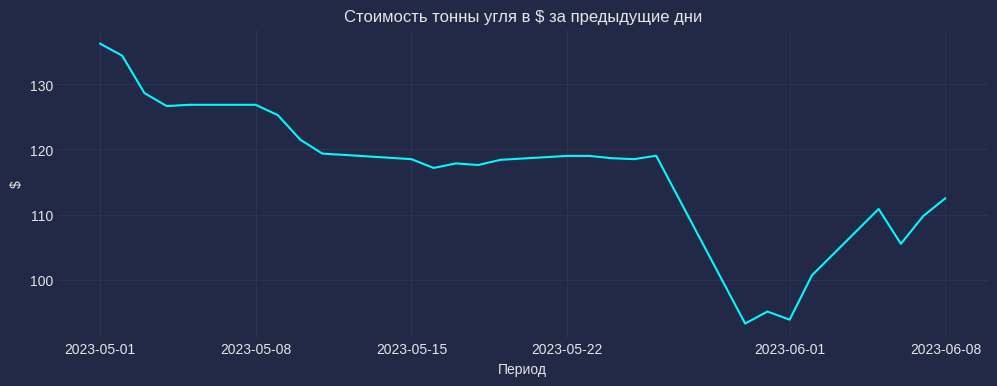

In [23]:
# график за ближайшие дни
fig = plt.figure(figsize=(12, 4))

plt.grid(2)
plt.title('Стоимость тонны угля в $ за предыдущие дни')
plt.plot(coal['coal']['2023-05-01':])
# plt.plot(coal)


plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)


plt.show()


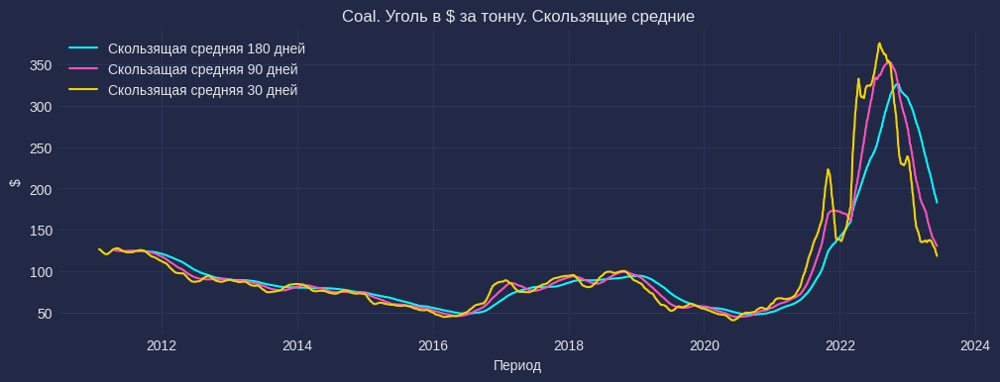

In [24]:
# скользящие средние разных периодов 

coal_rol180 = coal.rolling(180).mean()
coal_rol90 = coal.rolling(90).mean()
coal_rol30 = coal.rolling(30).mean()

# график скользящих средних

fig, ax = plt.subplots(figsize = (12,4), dpi = 100)

# plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(coal_rol180, label='Скользящая средняя 180 дней')
plt.plot(coal_rol90, label='Скользащая средняя 90 дней')
plt.plot(coal_rol30, label='Скользящая средняя 30 дней')
plt.title('Coal. Уголь в $ за тонну. Скользящие средние')

plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)


plt.legend()
plt.show()

На вышепредставленном графике на основании рекомендаций из технического анализа следует обратить внимание на пересечение короткой и длинной скользящих средних. Особенность пересчечения короткой скользящей средней с верху или с низу показывает изменение тренда.

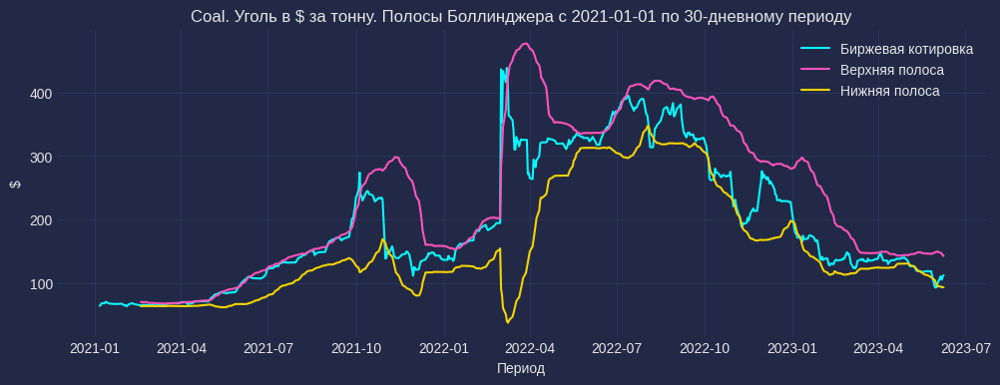

In [25]:
# Уголь в $. Полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

coal_d = coal[date:]
coal_ma = coal_d.rolling(window=n).mean()
coal_sd = coal_d.rolling(window=n).std()

coal_line1 = coal_ma + (2 * coal_sd)
coal_line2 = coal_ma - (2 * coal_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(coal_d, label='Биржевая котировка')
plt.plot(coal_line1, label='Верхняя полоса')
plt.plot(coal_line2, label='Нижняя полоса')
plt.title(f'Coal. Уголь в $ за тонну. Полосы Боллинджера c {date} по {n}-дневному периоду')

plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)

plt.legend()
plt.show()

# На графике полос Боллинджера смотрим на ... дописать

<h3 id="Brent">Нефть</h3>

### Нефть $ за баррель

###### BZ=F


<a href="https://finance.yahoo.com/quote/BZ=F?p=BZ=F" target="_blank">https://finance.yahoo.com/quote/BZ=F?p=BZ=F</a>


<a href="#top">К оглавлению</a>

In [26]:
# 
brent = df02[['brent']].copy()

brent.dropna(how='any', inplace=True)

brent

Ticker,brent
Date,
2008-01-02,97.84
2008-01-03,97.60
2008-01-04,96.79
2008-01-07,94.39
2008-01-08,95.54
...,...
2023-06-05,76.71
2023-06-06,76.29
2023-06-07,76.95


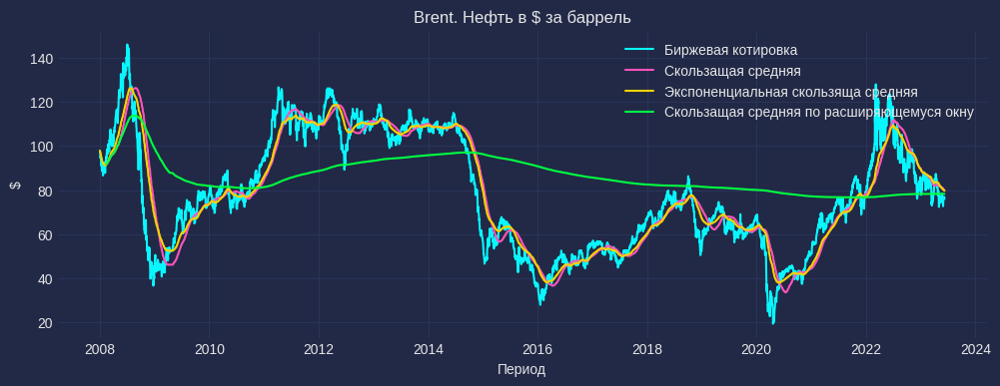

In [27]:
# нефть


plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(brent, label='Биржевая котировка')
plt.plot(brent.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(brent.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(brent.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.title('Brent. Нефть в $ за баррель')

plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)

plt.legend()
plt.show()

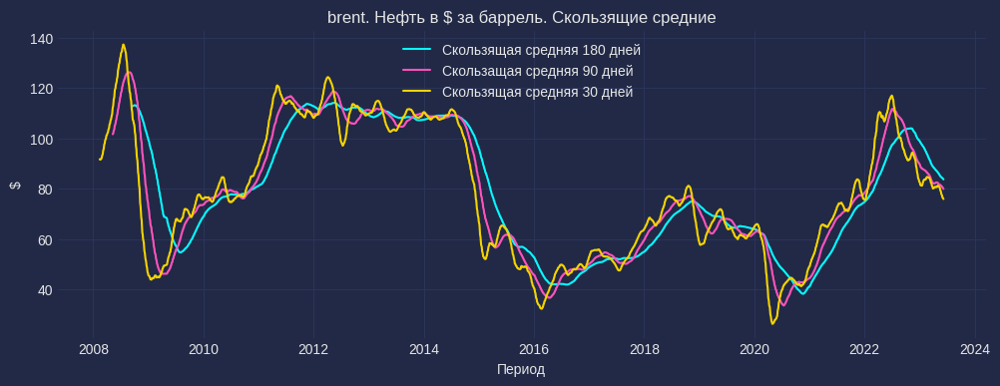

In [28]:
# скользящие средние разных периодов 

brent_rol180 = brent.rolling(180).mean()
brent_rol90 = brent.rolling(90).mean()
brent_rol30 = brent.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(brent_rol180, label='Скользящая средняя 180 дней')
plt.plot(brent_rol90, label='Скользащая средняя 90 дней')
plt.plot(brent_rol30, label='Скользящая средняя 30 дней')
plt.title('brent. Нефть в $ за баррель. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

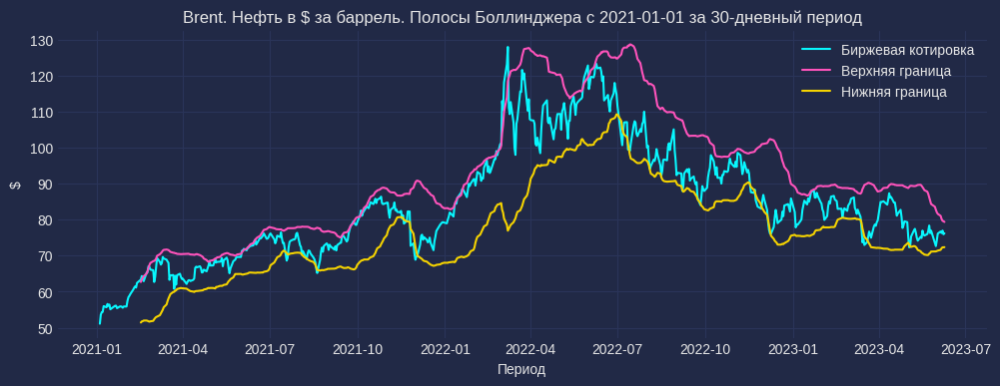

In [29]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

brent_d = brent[date:]
brent_ma = brent_d.rolling(window=n).mean()
brent_sd = brent_d.rolling(window=n).std()

brent_line1 = brent_ma + (2 * brent_sd)
brent_line2 = brent_ma - (2 * brent_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(brent_d, label='Биржевая котировка')
plt.plot(brent_line1, label='Верхняя граница')
plt.plot(brent_line2, label='Нижняя граница')
plt.title(f'Brent. Нефть в $ за баррель. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

<h3 id="Gold">Золото</h3>

### Золото $ за тройскую унцию

###### GC=F

<a href="https://finance.yahoo.com/quote/GC=F?p=GC=F" target="_blank">https://finance.yahoo.com/quote/GC=F?p=GC=F</a>

<a href="#top">К оглавлению</a>

In [30]:
gold = df02[['gold']].copy()

gold.dropna(how='any', inplace=True)

gold

Ticker,gold
Date,
2008-01-02,857.00000
2008-01-03,866.40002
2008-01-04,863.09998
2008-01-07,859.59998
2008-01-08,878.00000
...,...
2023-06-05,1958.00000
2023-06-06,1965.50000
2023-06-07,1942.69995


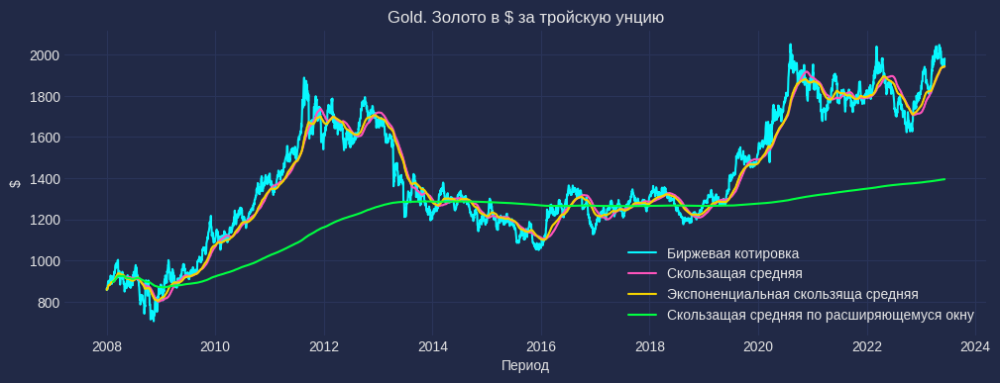

In [31]:
# золото


plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(gold, label='Биржевая котировка')
plt.plot(gold.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(gold.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(gold.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.title('Gold. Золото в $ за тройскую унцию')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

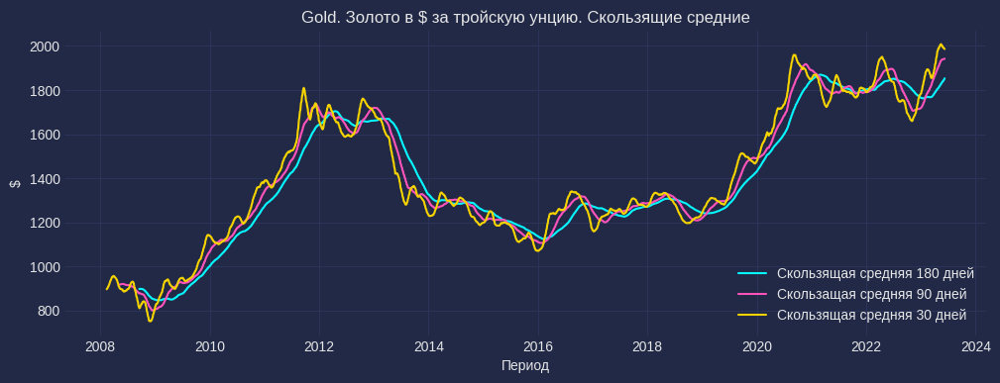

In [32]:
# скользящие средние разных периодов 

gold_rol180 = gold.rolling(180).mean()
gold_rol90 = gold.rolling(90).mean()
gold_rol30 = gold.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(gold_rol180, label='Скользящая средняя 180 дней')
plt.plot(gold_rol90, label='Скользащая средняя 90 дней')
plt.plot(gold_rol30, label='Скользящая средняя 30 дней')
plt.title('Gold. Золото в $ за тройскую унцию. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

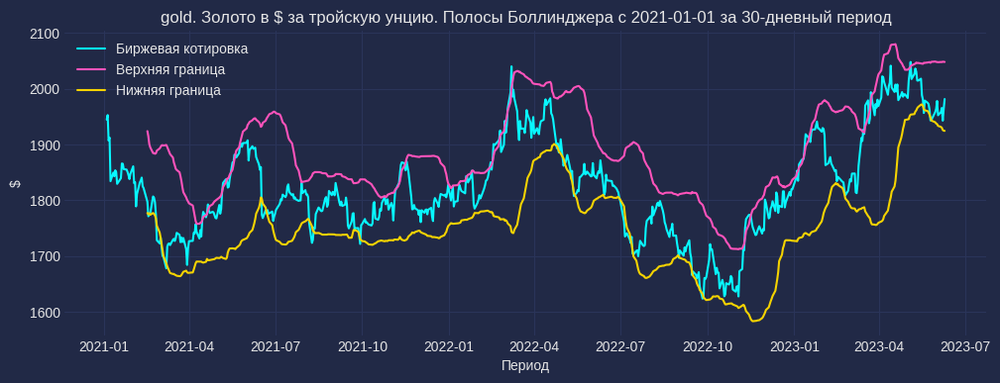

In [33]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

gold_d = gold[date:]
gold_ma = gold_d.rolling(window=n).mean()
gold_sd = gold_d.rolling(window=n).std()

gold_line1 = gold_ma + (2 * gold_sd)
gold_line2 = gold_ma - (2 * gold_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(gold_d, label='Биржевая котировка')
plt.plot(gold_line1, label='Верхняя граница')
plt.plot(gold_line2, label='Нижняя граница')
plt.title(f'gold. Золото в $ за тройскую унцию. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

In [34]:
# макс значение за заданный период

gold['2020-01-01': '2020-05-31'].max()

Ticker
gold    1756.69995
dtype: float64

<h3 id="Silver">Серебро</h3>

### Серебро $ за тройскую унцию

###### SI=F

<a href="https://finance.yahoo.com/quote/SI=F?p=SI=F" target="_blank">https://finance.yahoo.com/quote/SI=F?p=SI=F</a>


<a href="#top">К оглавлению</a>

In [35]:
silver = df02[['silver']].copy()

silver.dropna(how='any', inplace=True)

silver

Ticker,silver
Date,
2008-01-02,15.167
2008-01-03,15.382
2008-01-04,15.346
2008-01-07,15.180
2008-01-08,15.707
...,...
2023-06-05,23.534
2023-06-06,23.574
2023-06-07,23.439


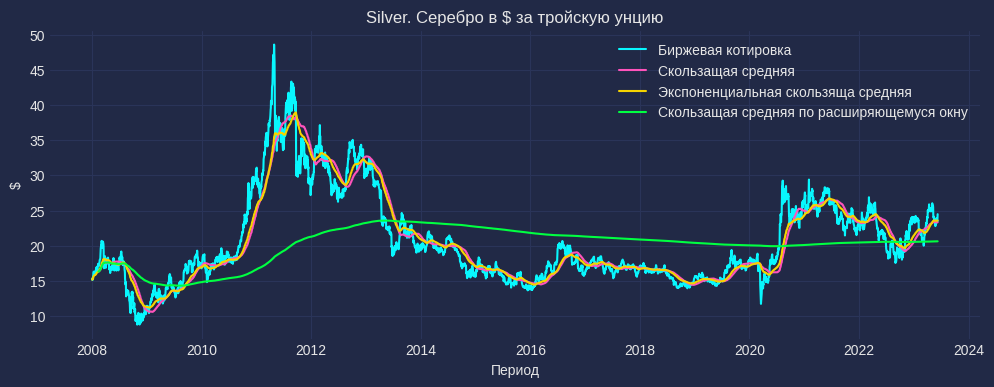

In [36]:
# серебро

plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(silver, label='Биржевая котировка')
plt.plot(silver.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(silver.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(silver.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.title('Silver. Серебро в $ за тройскую унцию')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

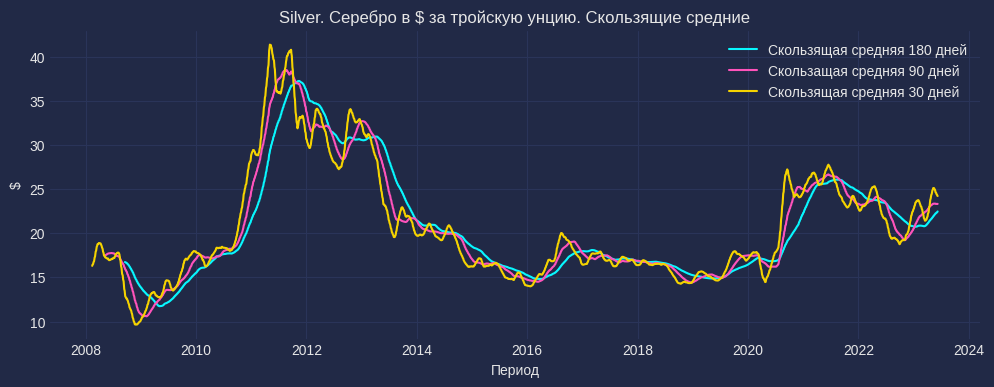

In [37]:
# скользящие средние разных периодов 

silver_rol180 = silver.rolling(180).mean()
silver_rol90 = silver.rolling(90).mean()
silver_rol30 = silver.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(silver_rol180, label='Скользящая средняя 180 дней')
plt.plot(silver_rol90, label='Скользащая средняя 90 дней')
plt.plot(silver_rol30, label='Скользящая средняя 30 дней')
plt.title('Silver. Серебро в $ за тройскую унцию. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

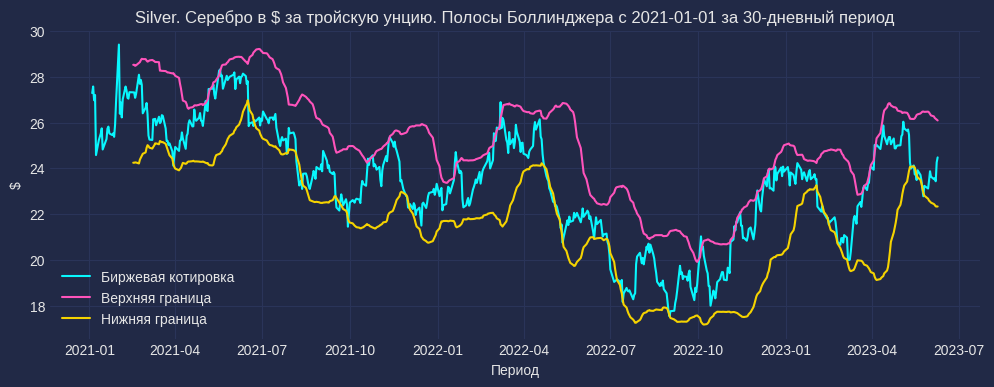

In [38]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

silver_d = silver[date:]
silver_ma = silver_d.rolling(window=n).mean()
silver_sd = silver_d.rolling(window=n).std()

silver_line1 = silver_ma + (2 * silver_sd)
silver_line2 = silver_ma - (2 * silver_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(silver_d, label='Биржевая котировка')
plt.plot(silver_line1, label='Верхняя граница')
plt.plot(silver_line2, label='Нижняя граница')
plt.title(f'Silver. Серебро в $ за тройскую унцию. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

<h3 id="Platinum">Платина</h3>

### Платина $ за тройскую унцию

###### PL=F

<a href="https://finance.yahoo.com/quote/PL=F?p=PL=F" target="_blank">https://finance.yahoo.com/quote/PL=F?p=PL=F</a>


<a href="#top">К оглавлению</a>

In [39]:
platinum = df02[['platinum']].copy()

platinum.dropna(how='any', inplace=True)

platinum

Ticker,platinum
Date,
2008-01-02,1547.00000
2008-01-03,1541.80005
2008-01-04,1539.09998
2008-01-07,1524.19995
2008-01-08,1553.59998
...,...
2023-06-05,1044.50000
2023-06-06,1046.80005
2023-06-07,1032.69995


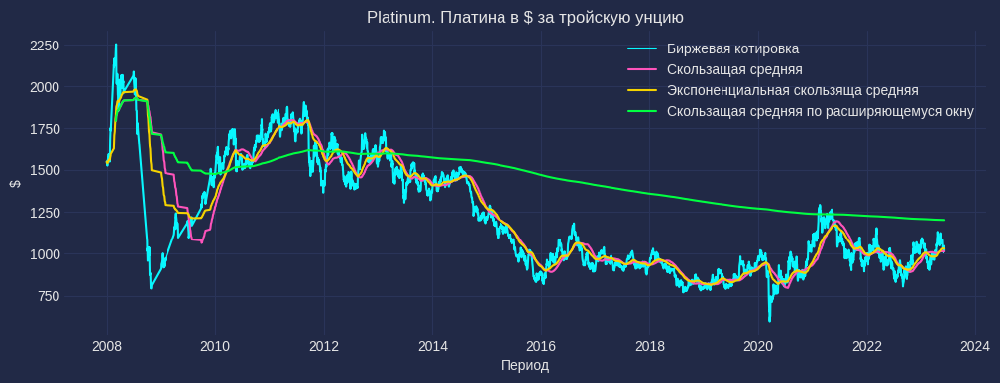

In [40]:
# Platinum

plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(platinum, label='Биржевая котировка')
plt.plot(platinum.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(platinum.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(platinum.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.title('Platinum. Платина в $ за тройскую унцию')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

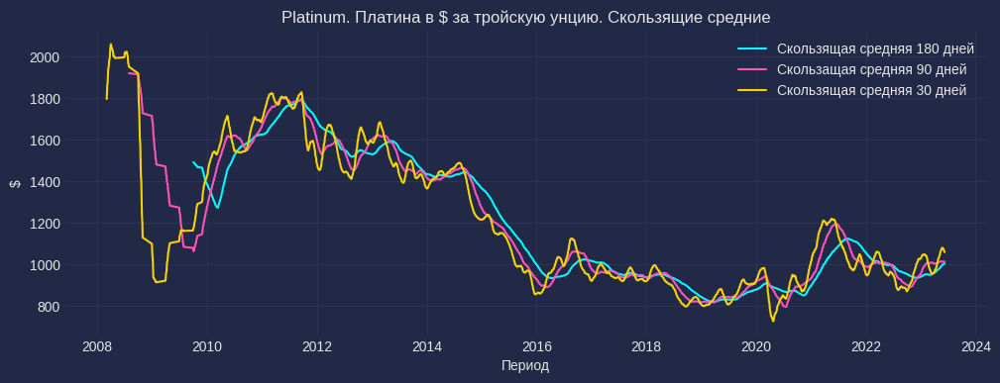

In [41]:
# скользящие средние разных периодов 

platinum_rol180 = platinum.rolling(180).mean()
platinum_rol90 = platinum.rolling(90).mean()
platinum_rol30 = platinum.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(platinum_rol180, label='Скользящая средняя 180 дней')
plt.plot(platinum_rol90, label='Скользащая средняя 90 дней')
plt.plot(platinum_rol30, label='Скользящая средняя 30 дней')
plt.title('Platinum. Платина в $ за тройскую унцию. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

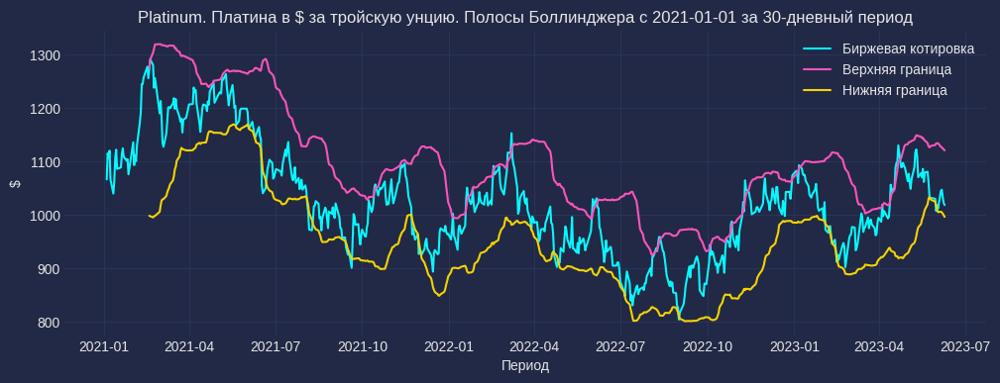

In [42]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

platinum_d = platinum[date:]
platinum_ma = platinum_d.rolling(window=n).mean()
platinum_sd = platinum_d.rolling(window=n).std()

platinum_line1 = platinum_ma + (2 * platinum_sd)
platinum_line2 = platinum_ma - (2 * platinum_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(platinum_d, label='Биржевая котировка')
plt.plot(platinum_line1, label='Верхняя граница')
plt.plot(platinum_line2, label='Нижняя граница')
plt.title(f'Platinum. Платина в $ за тройскую унцию. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

<h3 id="Gaz">Натуральный газ</h3>

### Натуральный газ (в долларах ($) на единицу MMBtu(1 млн БТЕ) (1 Btu ≈ 1054,615 Дж)

###### NG=F

<a href="https://finance.yahoo.com/quote/NG=F?p=NG=F" target="_blank">https://finance.yahoo.com/quote/NG=F?p=NG=F</a>


<a href="#top">К оглавлению</a>

In [43]:
gaz = df02[['gaz']].copy()

gaz.dropna(how='any', inplace=True)

gaz

Ticker,gaz
Date,
2008-01-02,7.850
2008-01-03,7.674
2008-01-04,7.841
2008-01-07,7.879
2008-01-08,7.967
...,...
2023-06-05,2.245
2023-06-06,2.262
2023-06-07,2.329


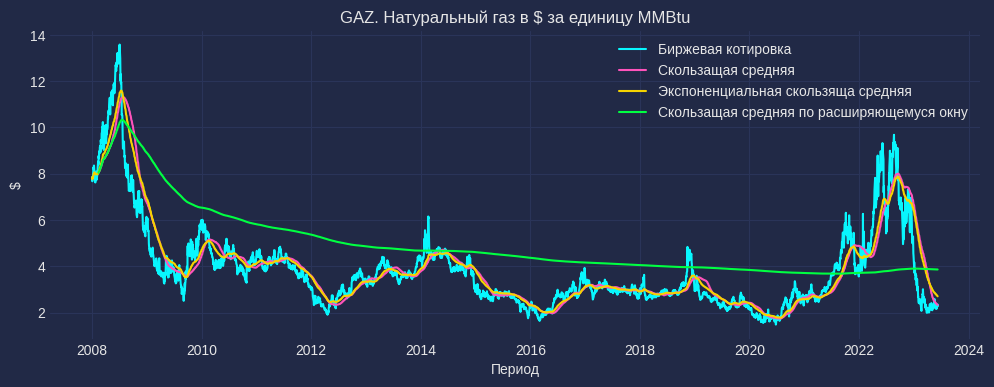

In [44]:
# газ


plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(gaz, label='Биржевая котировка')
plt.plot(gaz.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(gaz.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(gaz.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.title('GAZ. Натуральный газ в $ за единицу MMBtu')
plt.legend()
plt.show()

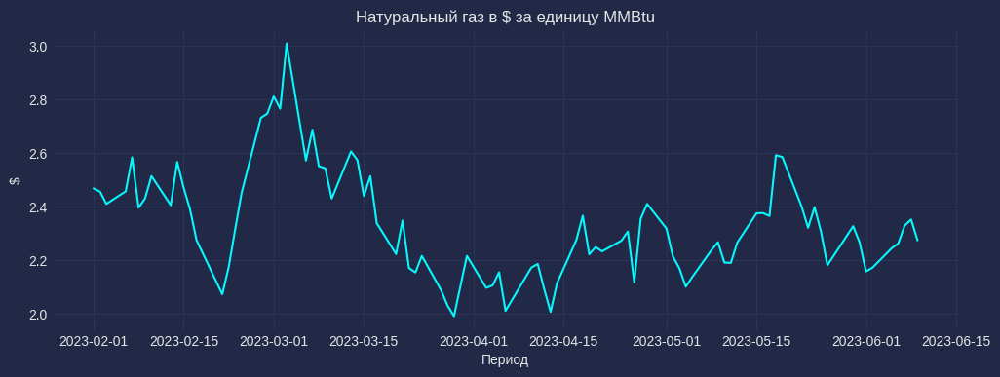

In [45]:
# график за ближайшие дни
fig = plt.figure(figsize=(12, 4))

plt.grid(2)
plt.title('Натуральный газ в $ за единицу MMBtu')
plt.plot(gaz['2023-02-01':])

plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)


plt.show()

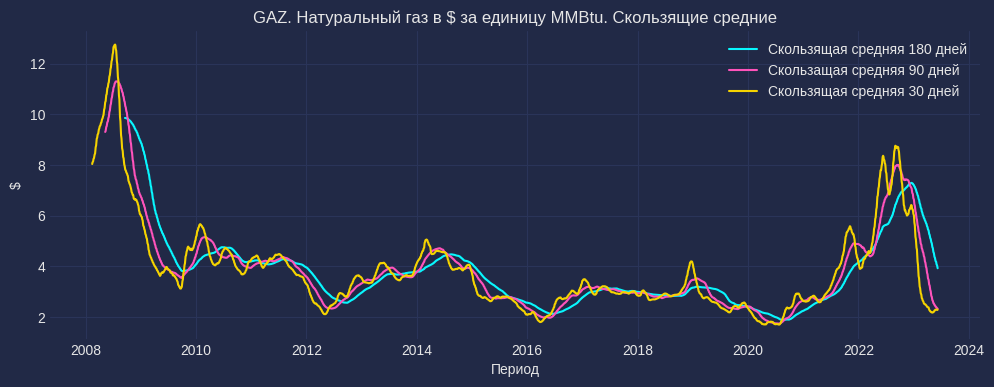

In [46]:
# скользящие средние разных периодов 

gaz_rol180 = gaz.rolling(180).mean()
gaz_rol90 = gaz.rolling(90).mean()
gaz_rol30 = gaz.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(True)
plt.plot(gaz_rol180, label='Скользящая средняя 180 дней')
plt.plot(gaz_rol90, label='Скользащая средняя 90 дней')
plt.plot(gaz_rol30, label='Скользящая средняя 30 дней')
plt.title('GAZ. Натуральный газ в $ за единицу MMBtu. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

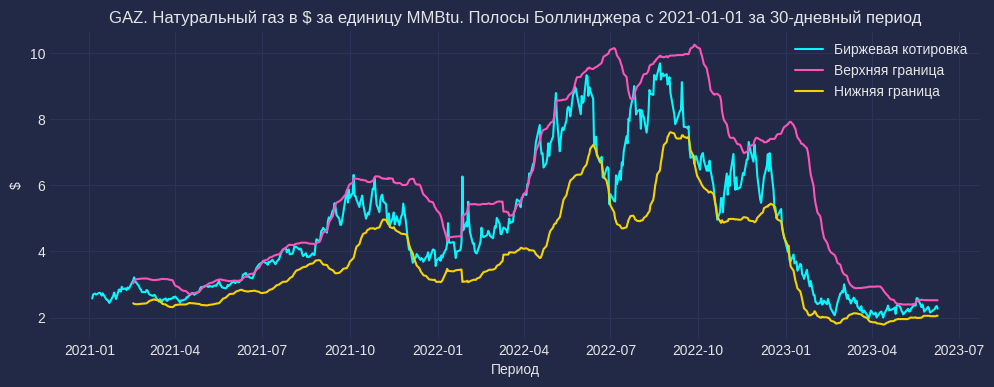

In [47]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

gaz_d = gaz[date:]
gaz_ma = gaz_d.rolling(window=n).mean()
gaz_sd = gaz_d.rolling(window=n).std()

gaz_line1 = gaz_ma + (2 * gaz_sd)
gaz_line2 = gaz_ma - (2 * gaz_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(gaz_d, label='Биржевая котировка')
plt.plot(gaz_line1, label='Верхняя граница')
plt.plot(gaz_line2, label='Нижняя граница')
plt.title(f'GAZ. Натуральный газ в $ за единицу MMBtu. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

<h3 id="Alum">Алюминий</h3>

### Алюминий $ за тонну

###### ALI=F

<a href="https://finance.yahoo.com/quote/ALI=F?p=ALI=F" target="_blank">https://finance.yahoo.com/quote/ALI=F?p=ALI=F</a>


<a href="#top">К оглавлению</a>

In [48]:
aluminum = df02[['aluminum']].copy()

aluminum.dropna(how='any', inplace=True)

aluminum

Ticker,aluminum
Date,
2014-05-06,2172.75
2014-05-07,2149.00
2014-05-08,2141.75
2014-05-09,2107.25
2014-05-12,2088.25
...,...
2023-06-05,2240.50
2023-06-06,2204.75
2023-06-07,2207.25


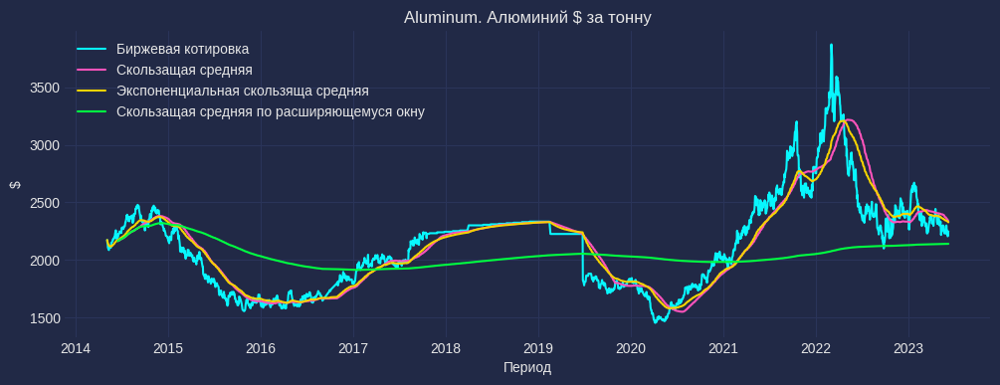

In [49]:
# Aluminum 


plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(aluminum, label='Биржевая котировка')
plt.plot(aluminum.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(aluminum.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(aluminum.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.title('Aluminum. Алюминий $ за тонну')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

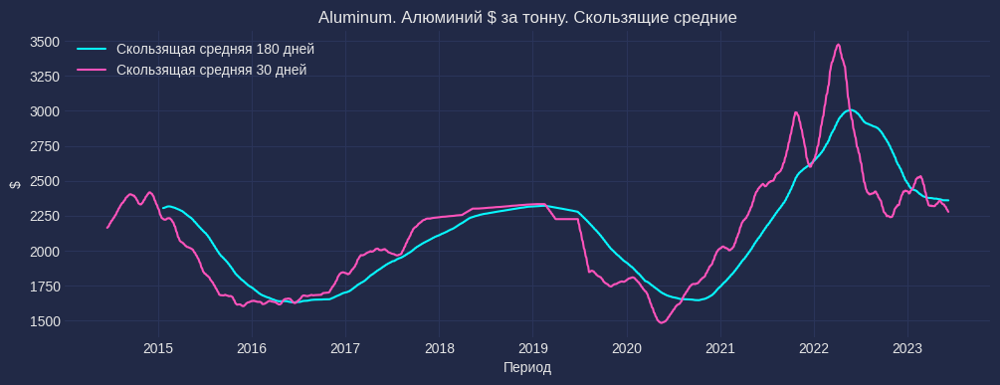

In [50]:
# скользящие средние разных периодов 

aluminum_rol180 = aluminum.rolling(180).mean()
aluminum_rol90 = aluminum.rolling(90).mean()
aluminum_rol30 = aluminum.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(aluminum_rol180, label='Скользящая средняя 180 дней')
# plt.plot(aluminum_rol90, label='Скользащая средняя 90 дней')
plt.plot(aluminum_rol30, label='Скользящая средняя 30 дней')
plt.title('Aluminum. Алюминий $ за тонну. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

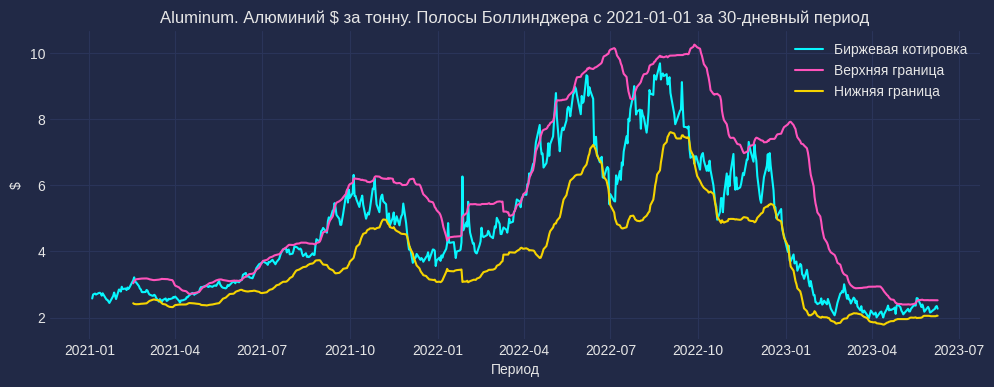

In [51]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

aluminum_d = gaz[date:]
aluminum_ma = aluminum_d.rolling(window=n).mean()
aluminum_sd = aluminum_d.rolling(window=n).std()

aluminum_line1 = aluminum_ma + (2 * aluminum_sd)
aluminum_line2 = aluminum_ma - (2 * aluminum_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(aluminum_d, label='Биржевая котировка')
plt.plot(aluminum_line1, label='Верхняя граница')
plt.plot(aluminum_line2, label='Нижняя граница')
plt.title(f'Aluminum. Алюминий $ за тонну. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

<h3 id="Cupper">Медь</h3>

### Медь $ за фунт

###### HG=

<a href="https://finance.yahoo.com/quote/HG%3DF?p=HG%3DF" target="_blank">https://finance.yahoo.com/quote/HG%3DF?p=HG%3DF</a>


<a href="#top">К оглавлению</a>

In [52]:
cupper = df02[['cupper']].copy()

cupper.dropna(how='any', inplace=True)

cupper

Ticker,cupper
Date,
2008-01-02,3.0505
2008-01-03,3.1730
2008-01-04,3.1415
2008-01-07,3.1250
2008-01-08,3.2735
...,...
2023-06-05,3.7625
2023-06-06,3.7670
2023-06-07,3.7545


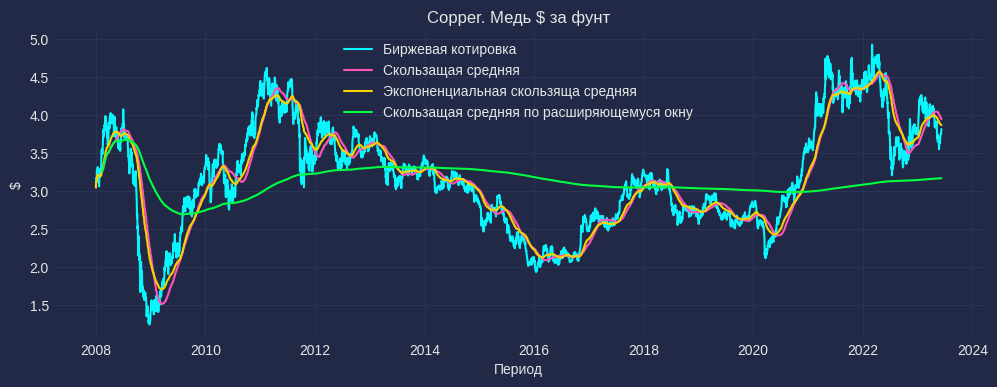

In [53]:
# Copper


plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(cupper, label='Биржевая котировка')
plt.plot(cupper.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(cupper.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(cupper.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.title('Copper. Медь $ за фунт')
plt.legend()
plt.show()

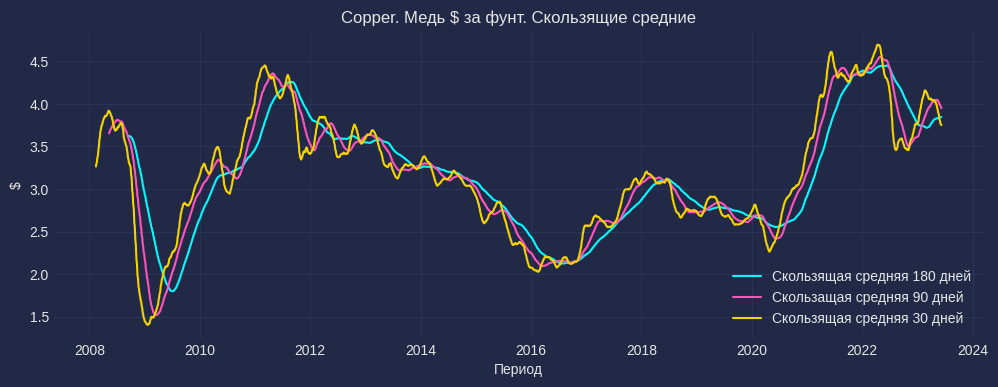

In [54]:
# скользящие средние разных периодов 

cupper_rol180 = cupper.rolling(180).mean()
cupper_rol90 = cupper.rolling(90).mean()
cupper_rol30 = cupper.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(cupper_rol180, label='Скользящая средняя 180 дней')
plt.plot(cupper_rol90, label='Скользащая средняя 90 дней')
plt.plot(cupper_rol30, label='Скользящая средняя 30 дней')
plt.title('Copper. Медь $ за фунт. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

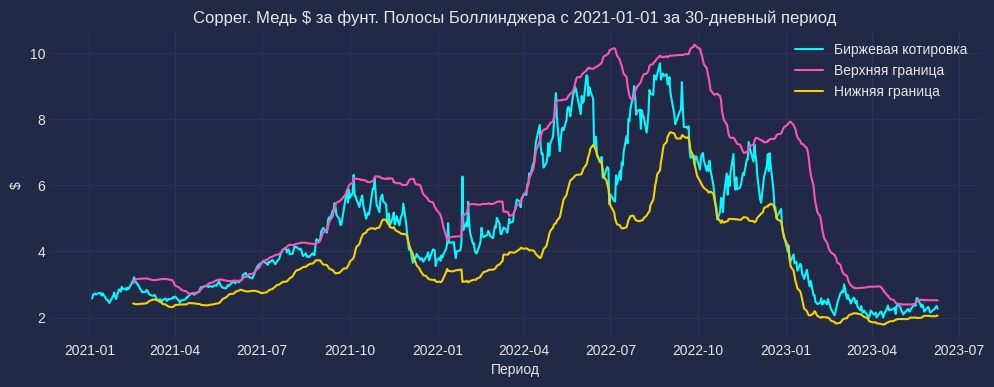

In [55]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

cupper_d = gaz[date:]
cupper_ma = cupper_d.rolling(window=n).mean()
cupper_sd = cupper_d.rolling(window=n).std()

cupper_line1 = cupper_ma + (2 * cupper_sd)
cupper_line2 = cupper_ma - (2 * cupper_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(cupper_d, label='Биржевая котировка')
plt.plot(cupper_line1, label='Верхняя граница')
plt.plot(cupper_line2, label='Нижняя граница')
plt.title(f'Copper. Медь $ за фунт. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

<h3 id="Corn">Кукуруза</h3>

### Кукуруза $ за 1 тонну

###### ZC=F

<a href="https://finance.yahoo.com/quote/ZC=F?p=ZC=F" target="_blank">https://finance.yahoo.com/quote/ZC=F?p=ZC=F</a>


<a href="#top">К оглавлению</a>

In [56]:
corn = df02[['cupper']].copy()

corn.dropna(how='any', inplace=True)

corn

Ticker,cupper
Date,
2008-01-02,3.0505
2008-01-03,3.1730
2008-01-04,3.1415
2008-01-07,3.1250
2008-01-08,3.2735
...,...
2023-06-05,3.7625
2023-06-06,3.7670
2023-06-07,3.7545


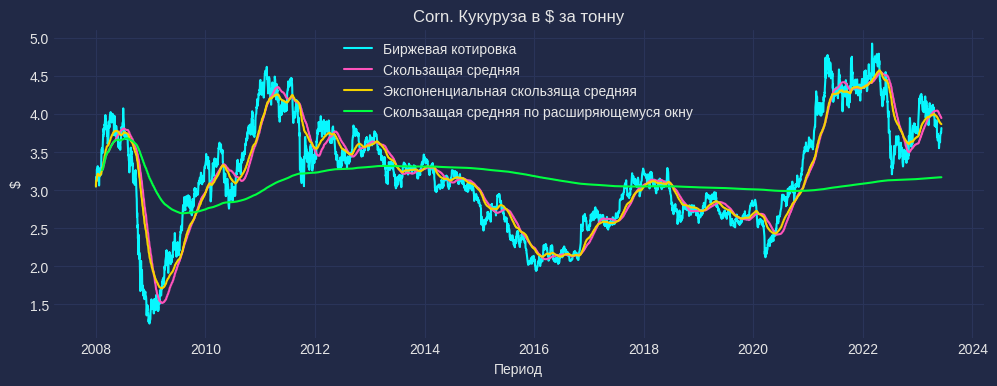

In [57]:
# Corn


plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(corn, label='Биржевая котировка')
plt.plot(corn.rolling(90, min_periods=30).mean(), label='Скользащая средняя')
plt.plot(corn.ewm(span=90).mean(), label='Экспоненциальная скользяща средняя')
plt.plot(corn.expanding(30).mean(), label='Скользащая средняя по расширяющемуся окну')
plt.title('Corn. Кукуруза в $ за тонну')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

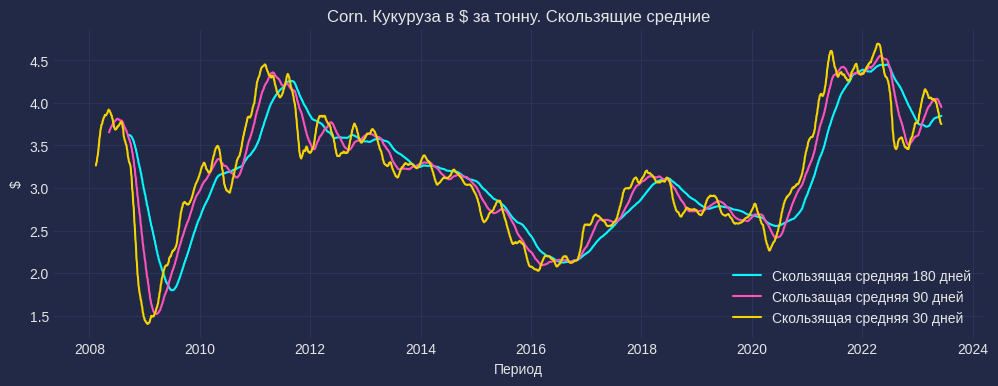

In [58]:
#  скользящие средние разных периодов 

corn_rol180 = corn.rolling(180).mean()
corn_rol90 = corn.rolling(90).mean()
corn_rol30 = corn.rolling(30).mean()

# график скользящих средних
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(corn_rol180, label='Скользящая средняя 180 дней')
plt.plot(corn_rol90, label='Скользащая средняя 90 дней')
plt.plot(corn_rol30, label='Скользящая средняя 30 дней')
plt.title('Corn. Кукуруза в $ за тонну. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

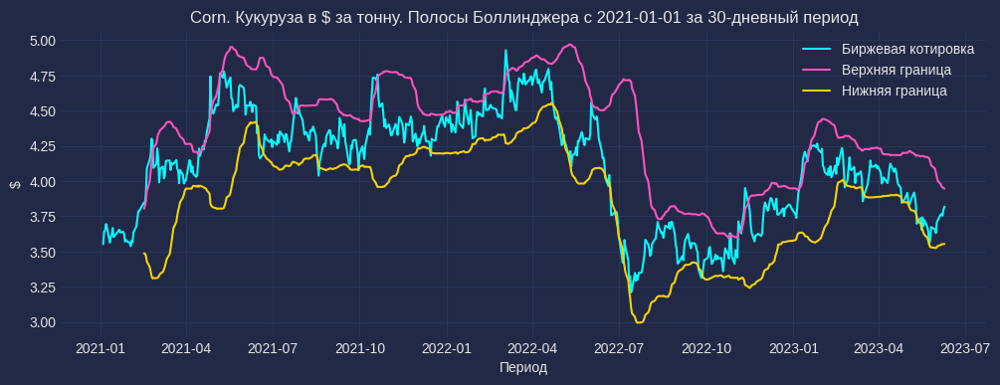

In [59]:
# полосы Боллинджера с заданной даты

n = 30
date = '2021-01-01'

corn_d = corn[date:]
corn_ma = corn_d.rolling(window=n).mean()
corn_sd = corn_d.rolling(window=n).std()

corn_line1 = corn_ma + (2 * corn_sd)
corn_line2 = corn_ma - (2 * corn_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(corn_d, label='Биржевая котировка')
plt.plot(corn_line1, label='Верхняя граница')
plt.plot(corn_line2, label='Нижняя граница')
plt.title(f'Corn. Кукуруза в $ за тонну. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("$", fontsize = 10)
plt.legend()
plt.show()

### S&P500

###### ^GSPC

<a href="https://finance.yahoo.com/quote/%5EGSPC?p=%5EGSPC" target="_blank">https://finance.yahoo.com/quote/%5EGSPC?p=%5EGSPC</a>


<a href="#top">К оглавлению</a>

In [60]:
SP = df02[['SP']].copy()

SP.dropna(how='any', inplace=True)

SP

Ticker,SP
Date,
2008-01-02,1447.16003
2008-01-03,1447.16003
2008-01-04,1411.63000
2008-01-07,1416.18005
2008-01-08,1390.18994
...,...
2023-06-02,4282.37012
2023-06-05,4273.79004
2023-06-06,4283.85010


<AxesSubplot:title={'center':'Индекс S&P500'}, xlabel='Date'>

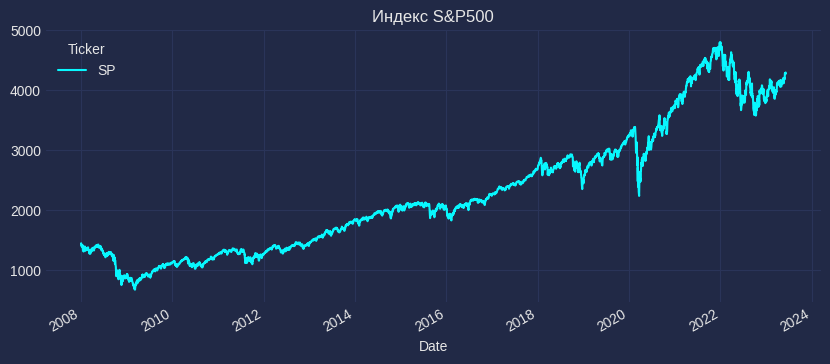

In [61]:
# S&P 500 (^GSPC)


SP.plot(figsize=(10,4), grid=True, title='Индекс S&P500')

### NASDAQ

###### ^IXIC

<a href="https://finance.yahoo.com/quote/%5EIXIC?p=%5EIXIC&.tsrc=fin-srch" target="_blank">https://finance.yahoo.com/quote/%5EIXIC?p=%5EIXIC&.tsrc=fin-srch</a>


<a href="#top">К оглавлению</a>

In [62]:
NASDAQ = df02['NASDAQ']

NASDAQ.dropna(how='any', inplace=True)

NASDAQ

/tmp/ipykernel_26626/3362688422.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NASDAQ.dropna(how='any', inplace=True)


Date
2008-01-02     2609.62988
2008-01-03     2602.67993
2008-01-04     2504.64990
2008-01-07     2499.45996
2008-01-08     2440.51001
                 ...     
2023-06-02    13240.76953
2023-06-05    13229.42969
2023-06-06    13276.41992
2023-06-07    13104.90039
2023-06-08    13238.51953
Name: NASDAQ, Length: 3886, dtype: float64

<AxesSubplot:title={'center':'Индекс NASDAQ'}, xlabel='Date'>

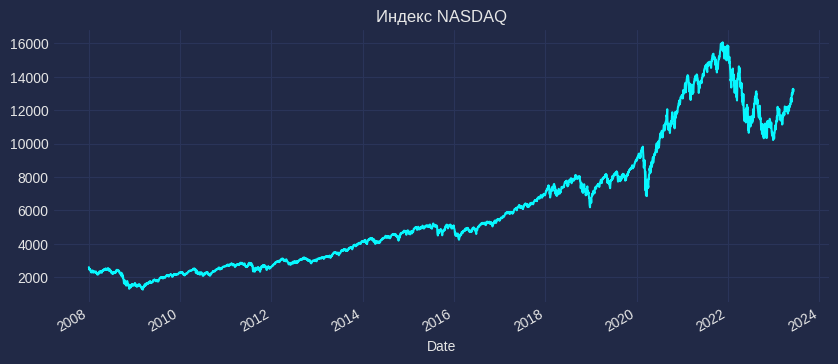

In [63]:
# NASDAQ Composite (^IXIC)

NASDAQ.plot(figsize=(10,4), grid=True, title='Индекс NASDAQ')

### <h3 id="df1">03. Анализ общего dateframe</h3>

###### df



<a href="#top">К оглавлению</a>

In [64]:
# делаю прореживание данных на среднемесячные значения
# Считаю, что нужно работать не с дневными значениями, т.к. корреляция с предыдущим днем почти равна ед.

df_month = df02.resample('M').mean()

# и делаю для ежедневн значений
df_day = df02.resample('D').mean()

df_month

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-31,2418.09380,1378.76381,NaN,92.11238,NaN,488.57143,3.20171,7.99148,891.35713,1587.18947,16.05210
2008-02-29,2325.82554,1354.87251,NaN,94.65250,NaN,516.07500,3.58955,8.64225,925.11000,2135.56668,17.65610
2008-03-31,2254.81804,1316.94299,NaN,102.79900,NaN,547.68750,3.81107,9.62430,962.93000,2030.57501,19.15790
2008-04-30,2368.09955,1370.46909,NaN,110.44182,NaN,593.36364,3.93939,10.28809,909.66364,2012.18502,17.47827
2008-05-31,2483.24097,1403.21762,NaN,124.38095,NaN,597.85714,3.77421,11.38162,888.20476,NaN,17.01200
...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28,11785.07432,4079.68472,2424.82895,83.50947,136.71053,671.09211,4.08824,2.43747,1853.23685,951.63684,21.89637
2023-03-31,11637.09222,3968.55915,2314.63043,79.20696,134.93043,637.39130,4.04915,2.40778,1912.96087,973.03478,21.97178
2023-04-30,12073.46474,4121.46736,2357.92105,83.36895,138.00474,654.88158,4.00037,2.19726,2001.04736,1054.50527,25.09232


In [65]:
# df_day.isna().sum()

In [66]:
# сохранил в excel что бы было.
# df02.to_excel('ts_base_coal_2022-11-04.xlsx')

In [67]:
# сводные статистики

df02.describe()

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
count,3886.00000,3886.00000,2253.00000,3830.00000,3028.00000,3883.00000,3887.00000,3888.00000,3886.00000,3586.00000,3884.00000
mean,6051.26420,2276.99184,2139.59964,78.30304,101.34471,483.43594,3.17152,3.86179,1394.87921,1200.49300,20.62654
std,3857.85247,1056.93515,396.45051,25.74392,67.39742,143.16802,0.71113,1.89233,305.38467,327.42516,6.43510
min,1268.64001,676.53003,1452.00000,19.33000,38.58000,293.50000,1.24750,1.48200,704.90002,595.90002,8.79000
25%,2784.03497,1343.41998,1800.50000,56.95500,60.90000,365.25000,2.67175,2.70200,1204.30005,933.90002,16.29700
50%,4890.23022,2067.76489,2222.25000,75.00000,83.50000,411.75000,3.13550,3.37300,1316.40002,1063.44995,18.29800
75%,8002.16504,2904.27753,2332.50000,104.15000,108.58750,615.37500,3.66600,4.33000,1670.70004,1481.99997,24.01525
max,16057.44043,4796.56006,3873.00000,146.08000,438.35001,831.25000,4.92900,13.57700,2051.50000,2251.10010,48.58400


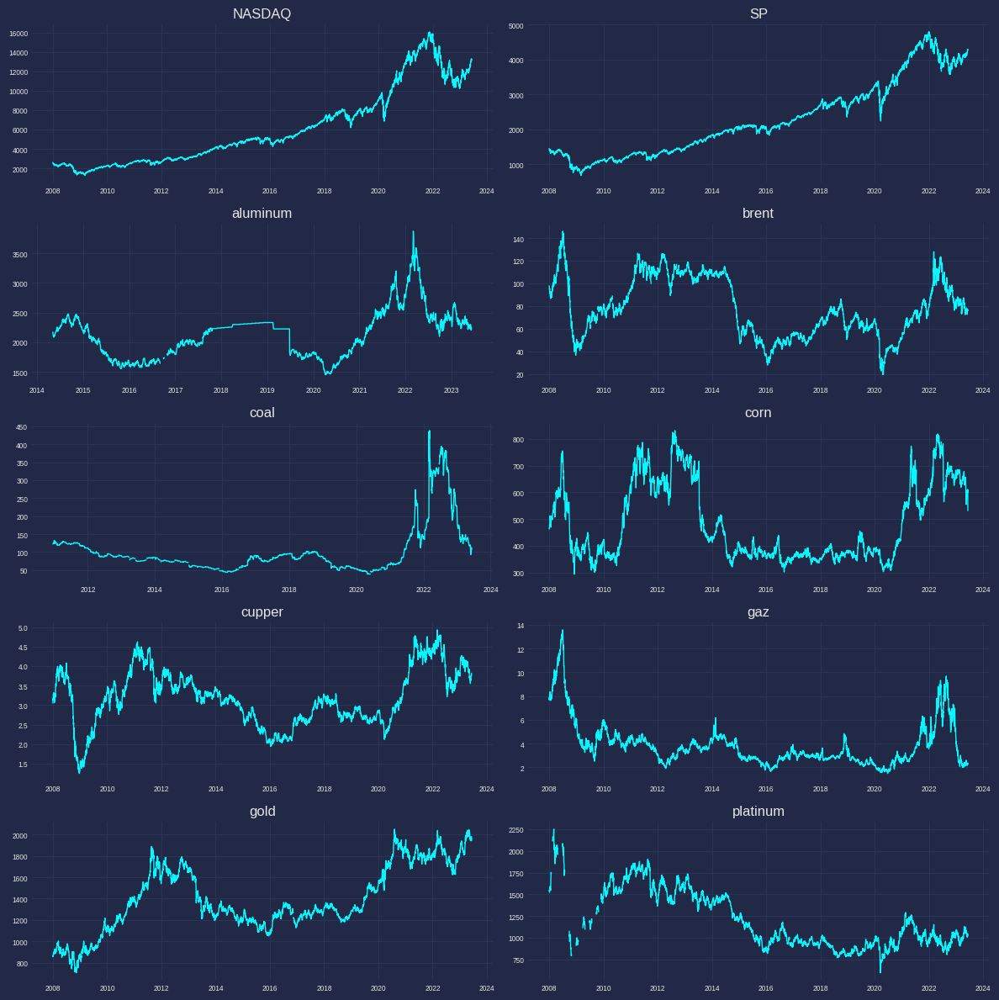

In [68]:
# графики для общего представления временных рядов
fig, axes = plt.subplots(nrows=5, ncols=2, dpi=100, figsize=(12,12)) 
for i, ax in enumerate(axes.flatten()):
    data_temp = df02[df02.columns[i]]
    ax.plot(data_temp, linewidth=1) # , color='blue'
    # Decorations
    ax.set_title(df02.columns[i])
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)
    ax.grid(1)

plt.tight_layout();

#### 03.1 Корреляция временных рядов
###### corr


<a href="#top">К оглавлению</a>

In [69]:
# Корреляция 
corr = df02.corr()
corr

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Ticker,,,,,,,,,,,
NASDAQ,1.00000,0.98988,0.55383,-0.24313,0.41094,0.11398,0.35033,-0.14188,0.68517,-0.62323,0.03812
SP,0.98988,1.00000,0.60920,-0.22778,0.44167,0.10714,0.33025,-0.13319,0.66014,-0.65699,-0.00006
aluminum,0.55383,0.60920,1.00000,0.77193,0.66745,0.66576,0.82998,0.61616,0.40025,0.20334,0.45125
brent,-0.24313,-0.22778,0.77193,1.00000,0.44359,0.72892,0.66507,0.51081,0.14909,0.71133,0.56974
coal,0.41094,0.44167,0.66745,0.44359,1.00000,0.57651,0.56912,0.82936,0.45795,-0.02263,0.20819
corn,0.11398,0.10714,0.66576,0.72892,0.57651,1.00000,0.76040,0.35212,0.53032,0.47773,0.73815
cupper,0.35033,0.33025,0.82998,0.66507,0.56912,0.76040,1.00000,0.30435,0.59284,0.46540,0.70189
gaz,-0.14188,-0.13319,0.61616,0.51081,0.82936,0.35212,0.30435,1.00000,-0.26734,0.36691,-0.06047
gold,0.68517,0.66014,0.40025,0.14909,0.45795,0.53032,0.59284,-0.26734,1.00000,-0.08582,0.65761


Text(0.5, 1.0, 'Корреляция ежедневных значений в $')

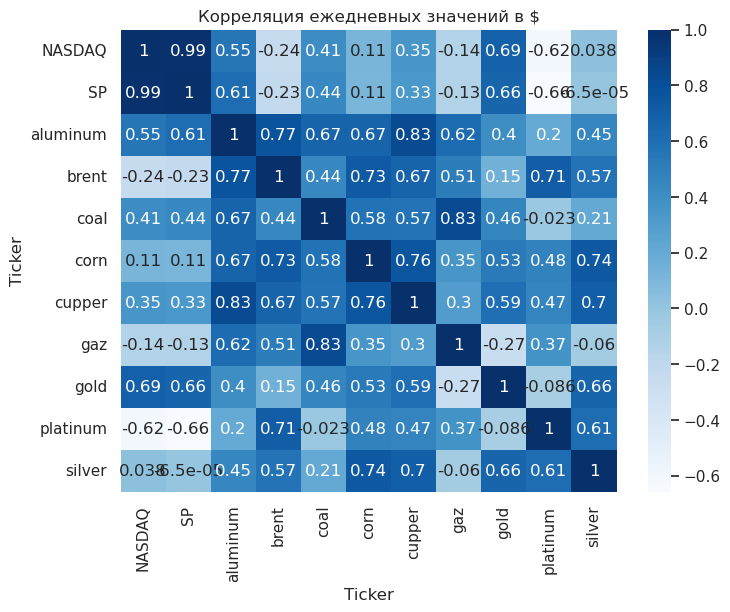

In [70]:
# Корреляция график heatmap

sns.set(rc = {'figure.figsize':(8, 6)})


sns.heatmap(corr, cmap='Blues', annot=True).set_title('Корреляция ежедневных значений в $')

Октябрь 2022:

Обратите внимание на пары товаров с высокой корреляцией (выше 0,75) такие как: 

Уголь - Газ         0,90 

Золото - Серебро    0,85

Уголь - Зерно       0,83 

Медь - Серебро      0,79 

Нефть - Алюминий    0,76 

Газ - Нефть         0,75 

Газ - Зерно         0,75 

Также следует заметить показатели корреляции платины, которые ведут себя практически независимо от других биржевых товаров. Смотрим на  показатель:

Платина - Серебро   0,36 - это пригодиться для последующего сравнения


июнь 2023:

Уголь - Газ         0,83 

Уголь - Зерно       0,58



In [71]:
# Определяем корреляцию Пирсона
# Коэффициент корреляции Пирсона применяется для исследования взаимосвязи двух переменных, 
# измеренных в метрических шкалах на одной и той же выборке. 
# Он позволяет определить, насколько пропорциональная изменчивость двух переменных.


# pearsonr(df['Coal'], df['Gold'])

# pearsonr(df['Brent'], df['CIF'])

# Коэфт корреляциии Спирмена
# Коэффициент корреляции Спирмена определяется как коэффициент корреляции Пирсона между ранговыми переменными.

# spearmanr(df['Brent'], df['Coal'])

# spearmanr(df['Brent'], df['CIF'])

Ticker       coal    brent      gaz     gold  platinum
Ticker                                                
coal      1.00000  0.44359  0.82936  0.45795  -0.02263
brent     0.44359  1.00000  0.51081  0.14909   0.71133
gaz       0.82936  0.51081  1.00000 -0.26734   0.36691
gold      0.45795  0.14909 -0.26734  1.00000  -0.08582
platinum -0.02263  0.71133  0.36691 -0.08582   1.00000


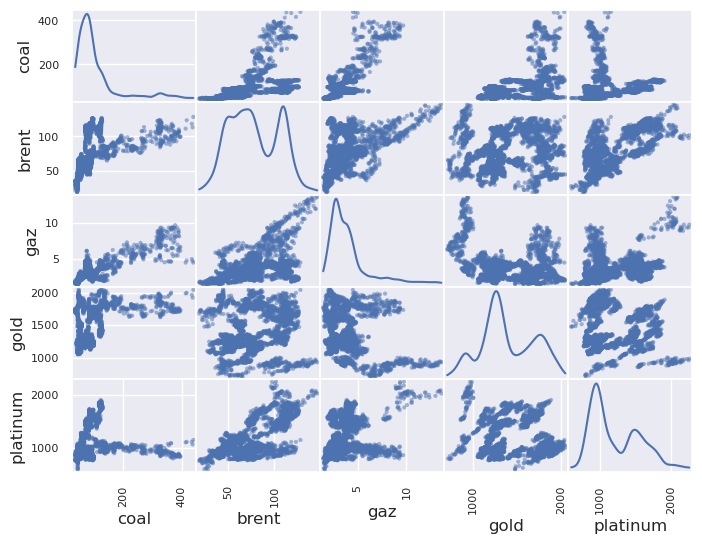

In [72]:
# Корреляция. Более наглядный график "scatter_matrix" по отдельным временным рядам

df1 = df02[["coal", 'brent', "gaz", 'gold', 'platinum']]

print(df1.corr())
pd.plotting.scatter_matrix(df1, diagonal='kde'); # , diagonal='kde'

#### 03.2 Ежедневная волотильность временных рядов
###### df_corr


<a href="#top">К оглавлению</a>

In [73]:
#  Ежедн изм

df_diff = df02 - df02.shift(1)

df_diff.dropna(inplace=True)

df_diff

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2014-05-07,-13.09009,10.48999,-23.75,1.07000,-0.30,-2.75,-0.0245,-0.059,-19.70007,-23.29993,-0.300
2014-05-08,-16.16992,-2.57996,-7.25,-0.09000,0.30,3.00,0.0320,-0.168,-1.19995,3.29993,-0.204
2014-05-09,20.37012,2.84998,-34.50,-0.15000,0.00,-8.25,0.0180,-0.041,-0.09998,-8.19995,-0.017
2014-05-12,71.98975,18.17004,-19.00,0.52000,-0.05,-7.50,0.0660,-0.097,8.29993,12.00000,0.423
2014-05-13,-13.68994,0.79993,-3.00,0.82999,0.00,5.75,-0.0170,-0.076,-1.00000,13.79993,0.004
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-02,139.78906,61.35010,-29.75,1.85000,6.80,16.50,0.0160,0.014,-25.59998,-6.60004,-0.232
2023-06-05,-11.33984,-8.58008,-29.00,0.58000,10.20,-11.50,0.0400,0.073,5.59998,32.90002,-0.109
2023-06-06,46.99023,10.06006,-35.75,-0.42000,-5.35,10.50,0.0045,0.017,7.50000,2.30005,0.040


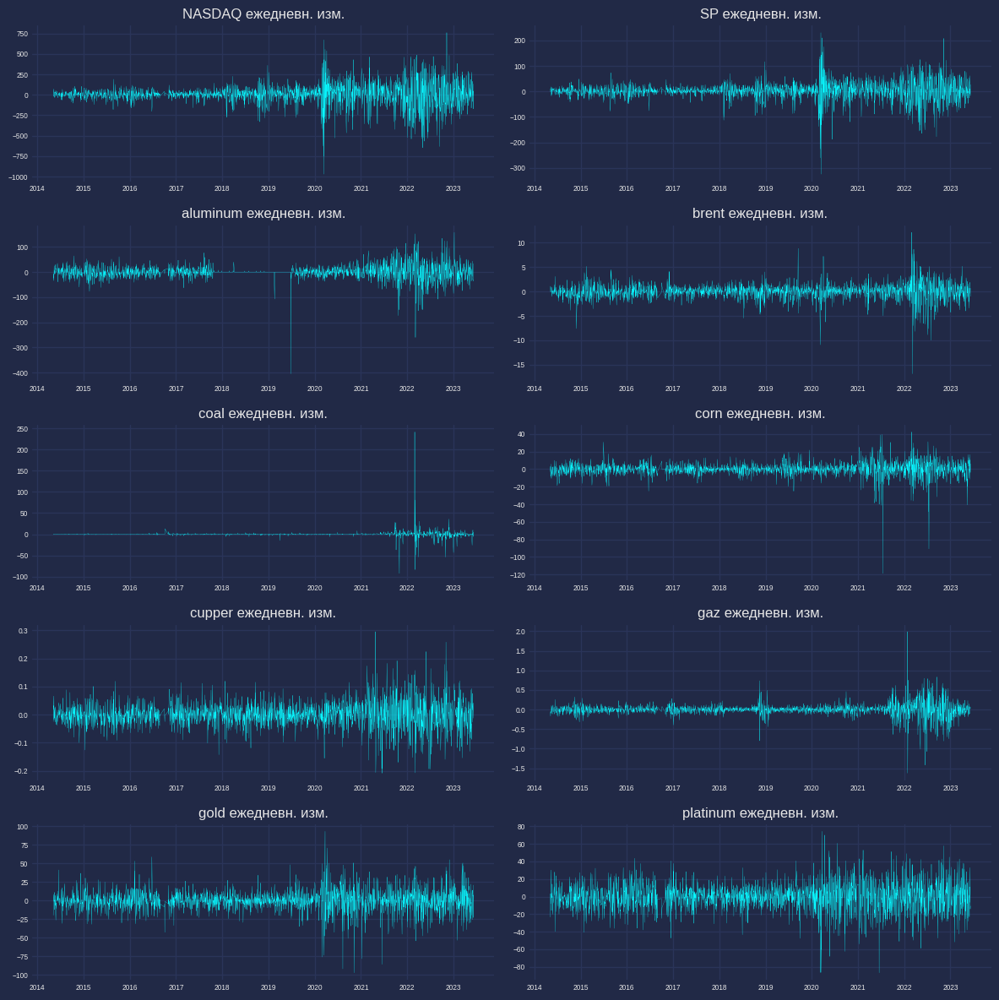

In [74]:
#  настройка графиков
plt.style.use("cyberpunk")

# графики ежедн изм
fig, axes = plt.subplots(nrows=5, ncols=2, dpi=100, figsize=(12,12)) 
for i, ax in enumerate(axes.flatten()):
    data_temp = df_diff[df_diff.columns[i]]
    ax.plot(data_temp, linewidth=0.2) # , color='black'
    # Decorations
    ax.set_title(df_diff.columns[i] + ' ежедневн. изм.')
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)
    ax.grid(1)

plt.tight_layout();

### <h3 id="scaler1">04. Шкалирование временных рядов</h3>

###### df1_scaler

В данном случае шкалирование произвожу методом MinMaxScaler в диапазоне (0, 1)


<a href="#top">К оглавлению</a>

In [75]:
# Шкалирование 

scalerMMS = preprocessing.MinMaxScaler()



In [76]:
# Шкалирование получение Series
series_scaler = scalerMMS.fit_transform(df02)
series_scaler

array([[0.09067604, 0.18704475,        nan, ..., 0.11295112, 0.5746133 ,
        0.16025029],
       [0.09020609, 0.18704475,        nan, ..., 0.11993168, 0.57147171,
        0.16565312],
       [0.08357743, 0.17842102,        nan, ..., 0.11748103, 0.56984045,
        0.16474845],
       ...,
       [0.80035297, 0.87159316, 0.31195787, ..., 0.91920388, 0.26389555,
        0.36812081],
       [0.80938813, 0.87800334, 0.32579513, ..., 0.93472447, 0.2574311 ,
        0.38885259],
       [       nan,        nan, 0.3283767 , ..., 0.94801723, 0.25501447,
        0.39428054]])

In [77]:
# DataFrame ежедневных данных из series с нормализованными данными,

df_scaler = pd.DataFrame(series_scaler, index=df02.index)

df_scaler.columns = col

df_scaler

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,0.09068,0.18704,NaN,0.61941,NaN,0.31427,0.48975,0.52650,0.11295,0.57461,0.16025
2008-01-03,0.09021,0.18704,NaN,0.61751,NaN,0.32078,0.52302,0.51195,0.11993,0.57147,0.16565
2008-01-04,0.08358,0.17842,NaN,0.61112,NaN,0.32218,0.51446,0.52575,0.11748,0.56984,0.16475
2008-01-07,0.08323,0.17953,NaN,0.59219,NaN,0.32125,0.50998,0.52890,0.11488,0.56084,0.16058
2008-01-08,0.07924,0.17322,NaN,0.60126,NaN,0.34449,0.55032,0.53617,0.12855,0.57860,0.17382
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,0.80877,0.87311,0.32569,0.45270,0.18078,0.56532,0.68315,0.06308,0.93057,0.27102,0.37051
2023-06-06,0.81195,0.87556,0.31093,0.44939,0.16740,0.58484,0.68437,0.06449,0.93614,0.27241,0.37151
2023-06-07,0.80035,0.87159,0.31196,0.45460,0.17803,0.57787,0.68097,0.07003,0.91920,0.26390,0.36812


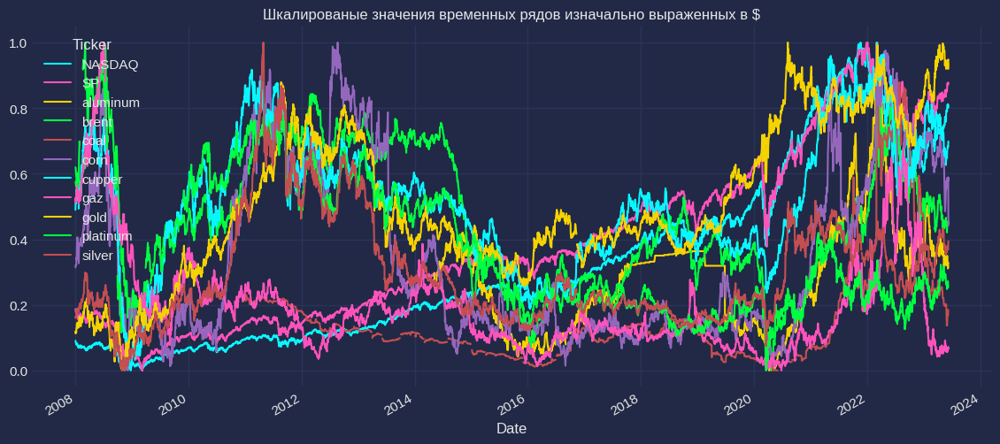

In [78]:
#  настройка графиков
plt.style.use("cyberpunk")

# График шкалированных врем рядов для наглядности
# В целом вид очень зашумленного и переполненного графика

df_scaler.plot(figsize=(14, 6), grid=True, title='Шкалированые значения временных рядов изначально выраженных в $');

Вышепредставленный график шкалированных в диапазоне 0 - 1 временных рядовов стоимости commodity выглядит очень зашумлено. Однако характерно видно начало COVID-19.

In [79]:
# Добавляю скользящие средние шкалированных значений
day = 30

df_scaler_roll_mean = df_scaler.rolling(day).mean() # (90, min_periods=30)

df_scaler_roll_mean

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,0.75597,0.84357,0.34690,0.44976,0.20708,0.59459,0.68331,0.06659,0.95414,0.28430,0.39123
2023-06-06,0.75876,0.84476,0.34455,0.44807,0.20434,0.59191,0.68162,0.06656,0.95356,0.28345,0.38978
2023-06-07,0.76170,0.84635,0.34287,0.44707,0.20182,0.58929,0.68080,0.06662,0.95229,0.28231,0.38857


<AxesSubplot:title={'center':'Скользящие средние шкалированых значений по периоду в 30 дней'}, xlabel='Date'>

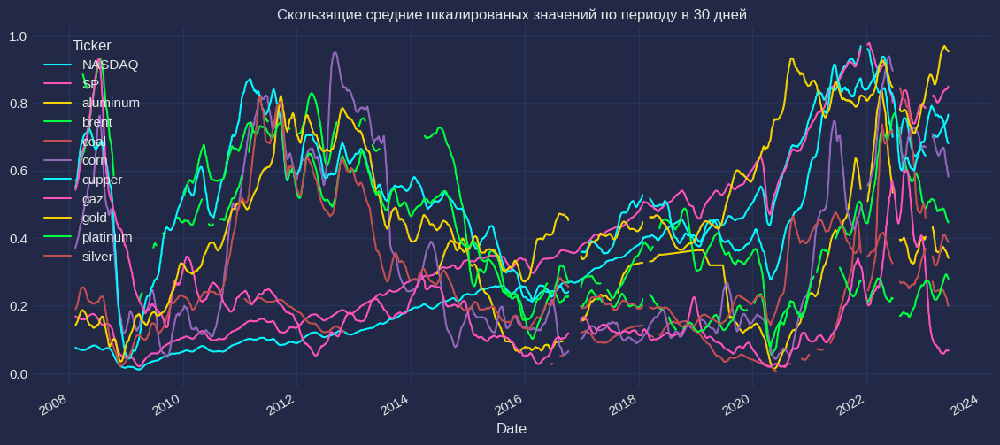

In [80]:
# График скользящих средних шкалированных значений
df_scaler_roll_mean.plot(figsize=(14, 6), grid=True, title=f'Скользящие средние шкалированых значений по периоду в {day} дней')
# пока отключил т.к. сложно интерпретируемо


При переходе к скользящим средмим шкалированных значений уже становится видно влияние начала событий 2022 года.

### 05. Перход к измерению в унциях золота
###### df_gold


<a href="#top">К оглавлению</a>

In [81]:
# Прересчет в унции золота

df_gold = pd.DataFrame()

for column in df02.columns:
    df_gold[column] = df02[column] / df02['gold']
    

df_gold

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,3.04508,1.68863,NaN,0.11417,NaN,0.53967,0.00356,0.00916,1.0,1.80513,0.01770
2008-01-03,3.00402,1.67031,NaN,0.11265,NaN,0.53786,0.00366,0.00886,1.0,1.77955,0.01775
2008-01-04,2.90192,1.63553,NaN,0.11214,NaN,0.54078,0.00364,0.00908,1.0,1.78322,0.01778
2008-01-07,2.90770,1.64749,NaN,0.10981,NaN,0.54240,0.00364,0.00917,1.0,1.77315,0.01766
2008-01-08,2.77962,1.58336,NaN,0.10882,NaN,0.54527,0.00373,0.00907,1.0,1.76948,0.01789
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,6.75660,2.18273,1.14428,0.03918,0.05661,0.30516,0.00192,0.00115,1.0,0.53345,0.01202
2023-06-06,6.75473,2.17952,1.12172,0.03881,0.05368,0.30934,0.00192,0.00115,1.0,0.53259,0.01199
2023-06-07,6.74572,2.19670,1.13618,0.03961,0.05649,0.31104,0.00193,0.00120,1.0,0.53158,0.01207


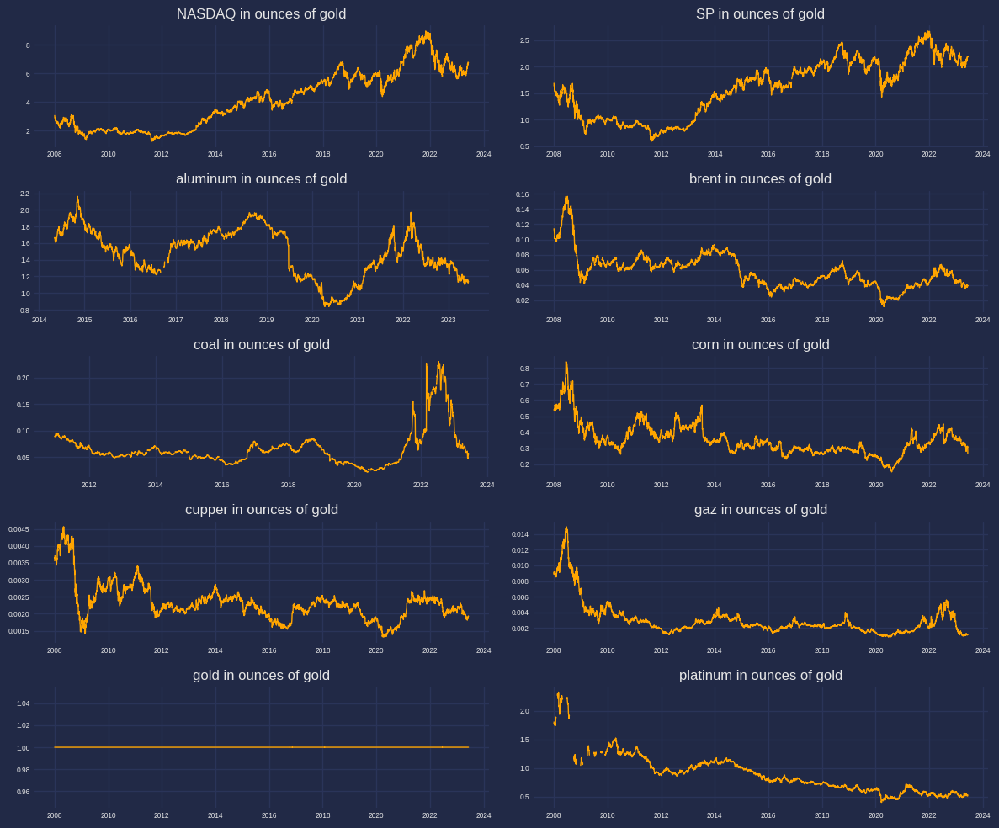

In [82]:
# графики стоимости выраженыех в унциях золота
fig, axes = plt.subplots(nrows=5, ncols=2, dpi=100, figsize=(12,10)) 
for i, ax in enumerate(axes.flatten()):
    data_temp = df_gold[df_gold.columns[i]]
    ax.plot(data_temp, color='orange', linewidth=1)
    # Decorations
    ax.set_title(df_gold.columns[i]+' in ounces of gold')
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)
    ax.grid(1)

plt.tight_layout();

In [83]:
# удаляю столбцы с постоянными значениями

df1_gold = df_gold.drop('gold', axis=1)


# делаю прореживание данных на среднемесячные значения
# так же делая для измерения в золоте и нефти
df_gold_month = df1_gold.resample('M').mean()
df_gold_day = df1_gold.resample('D').mean()

df_gold_month

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,platinum,silver
Date,,,,,,,,,,
2008-01-31,2.71576,1.54817,NaN,0.10343,NaN,0.54812,0.00359,0.00897,1.78656,0.01801
2008-02-29,2.51588,1.46540,NaN,0.10229,NaN,0.55787,0.00388,0.00934,2.25349,0.01907
2008-03-31,2.34426,1.36909,NaN,0.10681,NaN,0.56912,0.00396,0.01000,2.10902,0.01988
2008-04-30,2.60550,1.50771,NaN,0.12148,NaN,0.65257,0.00433,0.01132,2.20222,0.01921
2008-05-31,2.79762,1.58094,NaN,0.13999,NaN,0.67354,0.00425,0.01282,NaN,0.01915
...,...,...,...,...,...,...,...,...,...,...
2023-02-28,6.35950,2.20154,1.30801,0.04507,0.07380,0.36215,0.00221,0.00132,0.51343,0.01181
2023-03-31,6.08710,2.07665,1.21147,0.04150,0.07057,0.33350,0.00212,0.00126,0.50898,0.01148
2023-04-30,6.03389,2.05978,1.17842,0.04166,0.06897,0.32728,0.00200,0.00110,0.52707,0.01254


#### 05.1 Корреляция временных рядов выраженная в унциях золота
###### corr_gold


<a href="#top">К оглавлению</a>

In [84]:
# Корреляция в показателях пересчитаных в унции золота.

corr_gold = df_gold.corr()
corr_gold

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
NASDAQ,1.00000,0.96190,-0.16012,-0.53467,0.24057,-0.47206,-0.31347,-0.30679,NaN,-0.74707,-0.67013
SP,0.96190,1.00000,0.12801,-0.42537,0.24076,-0.40466,-0.22049,-0.17550,NaN,-0.66239,-0.70894
aluminum,-0.16012,0.12801,1.00000,0.74586,0.26378,0.36606,0.78043,0.53767,NaN,0.55259,0.29223
brent,-0.53467,-0.42537,0.74586,1.00000,0.27838,0.80553,0.83983,0.77173,NaN,0.79384,0.57103
coal,0.24057,0.24076,0.26378,0.27838,1.00000,0.39178,0.33863,0.70529,NaN,-0.15674,-0.02128
corn,-0.47206,-0.40466,0.36606,0.80553,0.39178,1.00000,0.71697,0.75143,NaN,0.63454,0.58425
cupper,-0.31347,-0.22049,0.78043,0.83983,0.33863,0.71697,1.00000,0.74975,NaN,0.78584,0.51522
gaz,-0.30679,-0.17550,0.53767,0.77173,0.70529,0.75143,0.74975,1.00000,NaN,0.70381,0.24191
gold,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
platinum,-0.74707,-0.66239,0.55259,0.79384,-0.15674,0.63454,0.78584,0.70381,NaN,1.00000,0.63513


Text(0.5, 1.0, 'Корреляции показателей, выраженных в унциях золота')

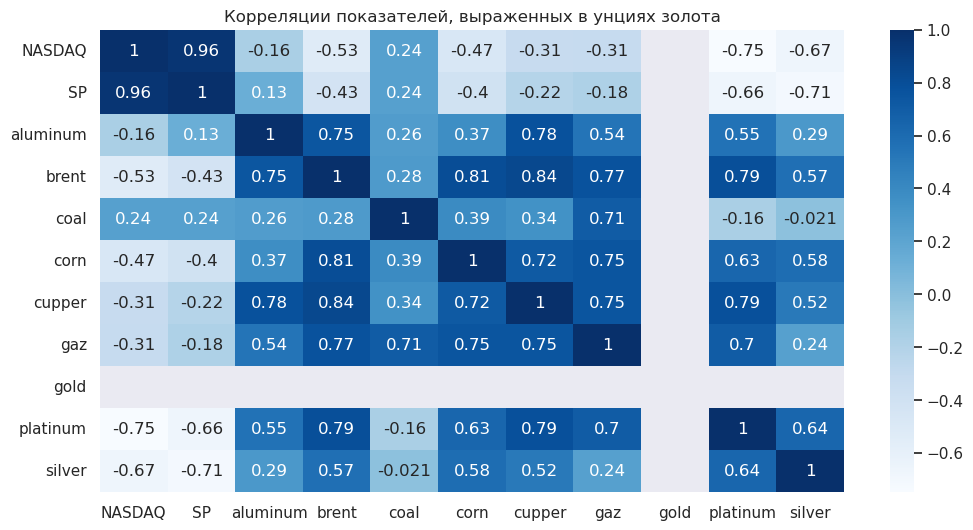

In [85]:
# граф корреляции средн мес знач выраж в унциях золота

sns.set(rc = {'figure.figsize':(12,6)})
sns.heatmap(corr_gold, cmap='Blues', annot=True).set_title('Корреляции показателей, выраженных в унциях золота')

Октябр 2022:

Посмотрим как трасформировалась корреляция при переходы с долл. на унции золота. Заметно снижение:

Уголь - Газ         0,90    --> 0,79 

Золото - Серебро    0,85    --> ---

Уголь - Зерно       0,83    --> 0,65

Медь - Серебро      0,79    --> 0,37

Нефть - Алюминий    0,76    --> 0,70

Газ - Нефть         0,75    --> 0,64

Газ - Зерно         0,75    --> 0,63


А вот, что с платиной идет увеличение:

Платина - Серебро   0,36    --> 0,67


июнь 2023:

Уголь - Газ         0,83    --> 0,71 

             coal    brent      gaz  aluminum
coal      1.00000  0.27838  0.70529   0.26378
brent     0.27838  1.00000  0.77173   0.74586
gaz       0.70529  0.77173  1.00000   0.53767
aluminum  0.26378  0.74586  0.53767   1.00000


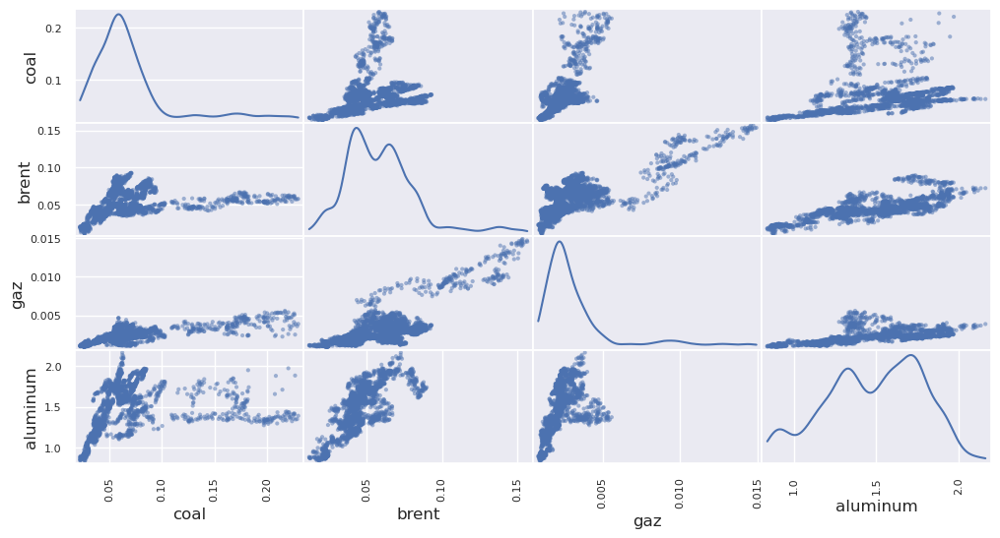

In [86]:
# Корреляция график scatter_matrix по отдельным временным рядам, выраженных в унциях золота

df1_gold = df_gold[["coal", 'brent', "gaz", 'aluminum']]

print(df1_gold.corr())
pd.plotting.scatter_matrix(df1_gold, diagonal='kde'); # , diagonal='kde'

In [87]:
# Временной ряд стоимости угля в унциях золота
coal_g = df_gold['coal']

coal_g.dropna(how='any', inplace=True)

coal_g

Date
2010-12-17    0.08886
2010-12-20    0.08842
2010-12-21    0.08878
2010-12-22    0.09050
2010-12-23    0.09076
               ...   
2023-06-02    0.05155
2023-06-05    0.05661
2023-06-06    0.05368
2023-06-07    0.05649
2023-06-08    0.05729
Name: coal, Length: 3028, dtype: float64

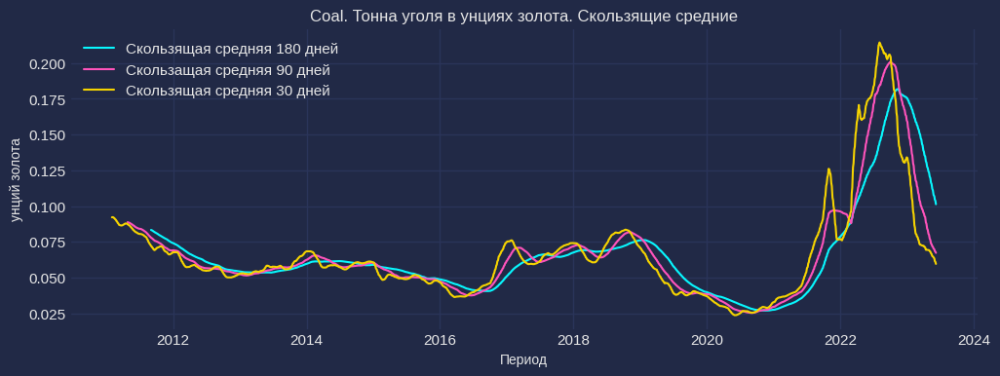

In [88]:
# Уголь в унциях золота
# Скользящие средние разных периодов в унциях золота


coal_g_rol180 = coal_g.rolling(180).mean()
coal_g_rol90 = coal_g.rolling(90).mean()
coal_g_rol30 = coal_g.rolling(30).mean()

# график скользящих средних
plt.style.use("cyberpunk")
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(coal_g_rol180, label='Скользящая средняя 180 дней')
plt.plot(coal_g_rol90, label='Скользащая средняя 90 дней')
plt.plot(coal_g_rol30, label='Скользящая средняя 30 дней')
plt.title('Coal. Тонна уголя в унциях золота. Скользящие средние')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("унций золота", fontsize = 10)
plt.legend()
plt.show()

Вышепредставленный график достаточно близко похож к скользящим средним стоимости удля в долл., но есть особенность, что короткая скользящая средняя в золоте не пересекает длинную, в отличии от оценки в долл.

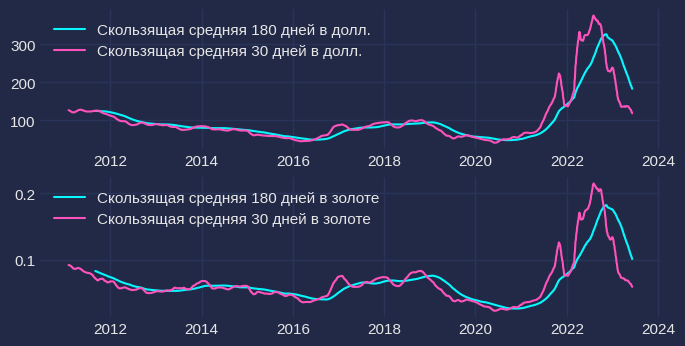

In [89]:
plt.style.use("cyberpunk")
plt.figure(figsize=(8, 4))
plt.subplot(211)
plt.plot(coal_rol180, label='Скользящая средняя 180 дней в долл.')
plt.plot(coal_rol30, label='Скользящая средняя 30 дней в долл.')
plt.legend()

plt.subplot(212)
plt.plot(coal_g_rol180, label='Скользящая средняя 180 дней в золоте')
plt.plot(coal_g_rol30, label='Скользящая средняя 30 дней в золоте')
plt.legend()

plt.show()

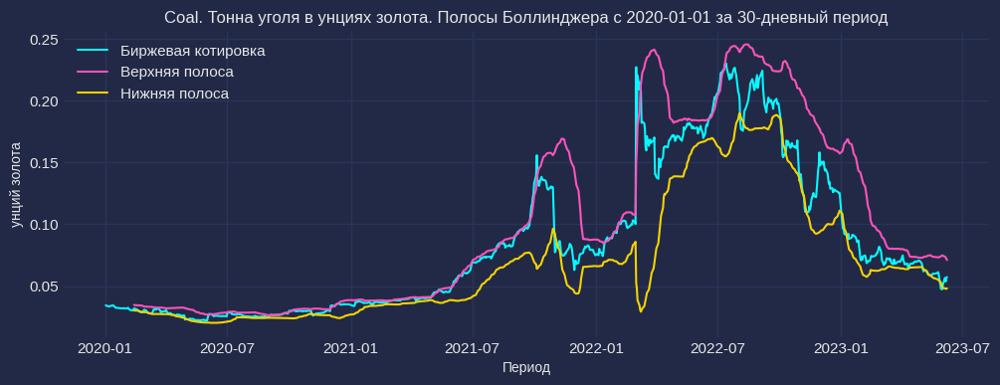

In [90]:
# Уголь в унциях золота
# полосы Боллинджера с заданной даты

n = 30
date = '2020-01-01'

coal_g_d = coal_g[date:]
coal_g_ma = coal_g_d.rolling(window=n).mean()
coal_g_sd = coal_g_d.rolling(window=n).std()

coal_g_line1 = coal_g_ma + (2 * coal_g_sd)
coal_g_line2 = coal_g_ma - (2 * coal_g_sd)

# График
plt.figure(figsize=(12, 4))
plt.grid(1)
plt.plot(coal_g_d, label='Биржевая котировка')
plt.plot(coal_g_line1, label='Верхняя полоса')
plt.plot(coal_g_line2, label='Нижняя полоса')
plt.title(f'Coal. Тонна уголя в унциях золота. Полосы Боллинджера c {date} за {n}-дневный период')
plt.xlabel("Период", fontsize = 10)
plt.ylabel("унций золота", fontsize = 10)
plt.legend()
plt.show()

In [91]:
# Нормализовываю знач в унциях золота

# series:
series_scaler_gold = scalerMMS.fit_transform(df_gold)

series_scaler_gold

# DataFrame с нормализованными данными:
df_gold_scaler = pd.DataFrame(series_scaler_gold, index=df_gold.index)

df_gold_scaler.columns = col

df_gold_scaler

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,0.23347,0.52651,NaN,0.70676,NaN,0.56300,0.69179,0.59078,0.0,0.72951,0.41843
2008-01-03,0.22816,0.51769,NaN,0.69632,NaN,0.56037,0.72342,0.56930,0.0,0.71622,0.42084
2008-01-04,0.21494,0.50095,NaN,0.69283,NaN,0.56461,0.71650,0.58545,0.0,0.71813,0.42197
2008-01-07,0.21569,0.50670,NaN,0.67675,NaN,0.56696,0.71515,0.59121,0.0,0.71290,0.41679
2008-01-08,0.19910,0.47583,NaN,0.66992,NaN,0.57113,0.74376,0.58469,0.0,0.71099,0.42666
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,0.71401,0.76439,0.23175,0.19044,0.16589,0.22267,0.18769,0.02170,0.0,0.06908,0.17485
2023-06-06,0.71377,0.76285,0.21475,0.18794,0.15175,0.22874,0.18614,0.02200,0.0,0.06863,0.17375
2023-06-07,0.71260,0.77112,0.22564,0.19342,0.16531,0.23120,0.19108,0.02541,0.0,0.06810,0.17681


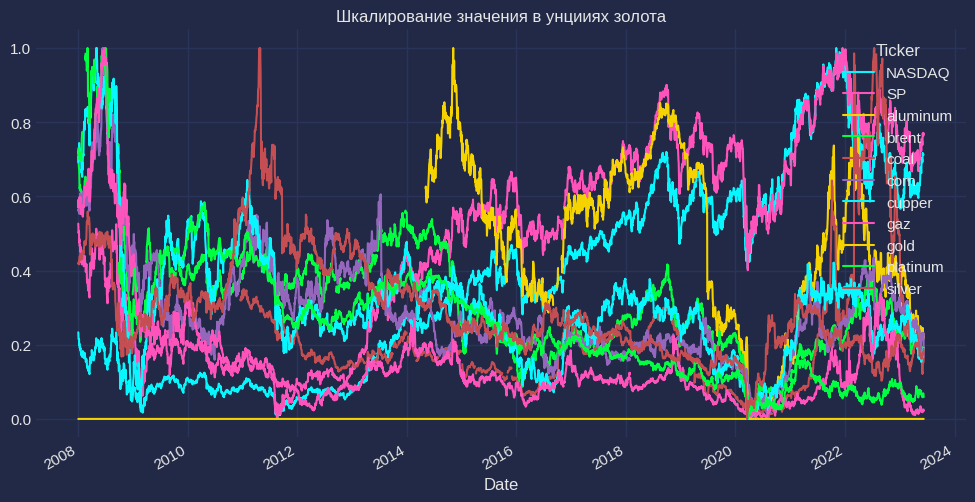

In [92]:
# График шкалированных значения временных рядов изначально выраженных в унциях золота
df_gold_scaler.plot(figsize=(12, 6), grid=True, title='Шкалирование значения в унцииях золота');

На вышепредставленном графике характерно виднен общее падение до маинимальных значений в первой половине 2020 года - начало COVID-19.
Напоминю, что стоимость одной унции золота взлетела тогда до 1750$.

### 06. Перход к измерению в баррелях нефти
###### df_brent


<a href="#top">К оглавлению</a>

In [93]:
# Прересчет в баррели нефти

df_brent = pd.DataFrame()

for column in df02.columns:
    df_brent[column] = df02[column] / df02['brent']
    

df_brent

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,26.67242,14.79109,NaN,1.0,NaN,4.72711,0.03118,0.08023,8.75920,15.81153,0.15502
2008-01-03,26.66680,14.82746,NaN,1.0,NaN,4.77459,0.03251,0.07863,8.87705,15.79713,0.15760
2008-01-04,25.87716,14.58446,NaN,1.0,NaN,4.82230,0.03246,0.08101,8.91724,15.90144,0.15855
2008-01-07,26.48014,15.00350,NaN,1.0,NaN,4.93961,0.03311,0.08347,9.10690,16.14790,0.16082
2008-01-08,25.54438,14.55087,NaN,1.0,NaN,5.01099,0.03426,0.08339,9.18987,16.26125,0.16440
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,172.46030,55.71360,29.20740,1.0,1.44505,7.78908,0.04905,0.02927,25.52470,13.61622,0.30679
2023-06-06,174.02569,56.15218,28.89959,1.0,1.38288,7.96959,0.04938,0.02965,25.76353,13.72133,0.30901
2023-06-07,170.30411,55.45835,28.68421,1.0,1.42625,7.85250,0.04879,0.03027,25.24626,13.42040,0.30460


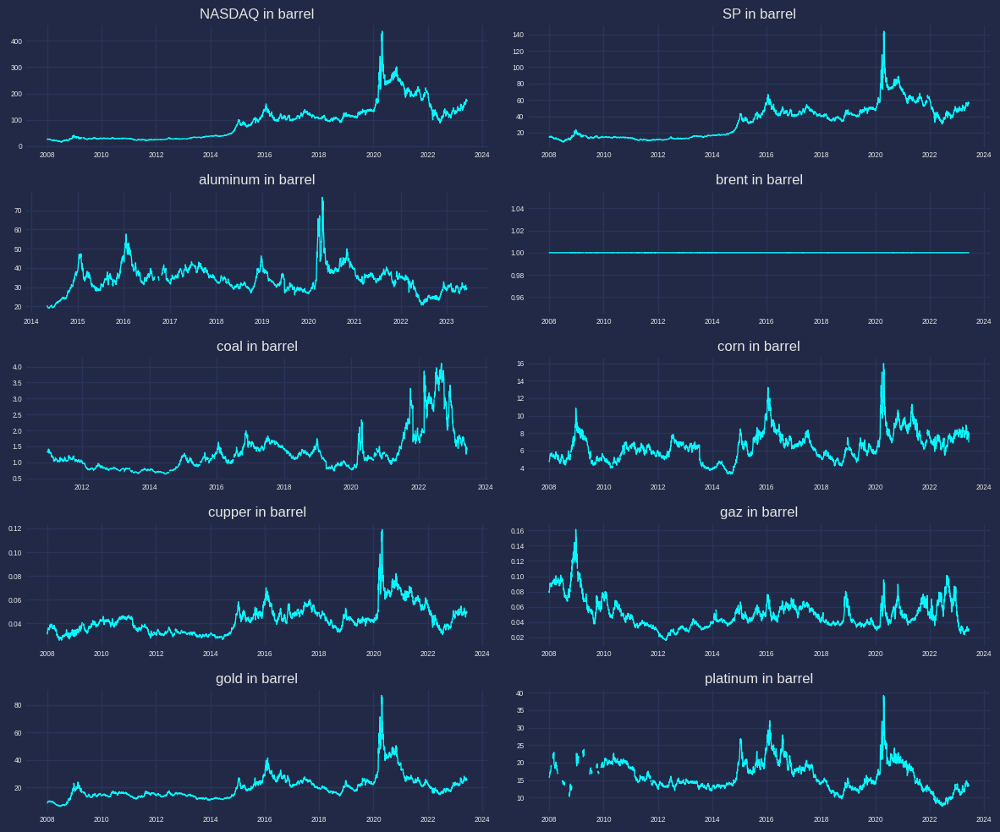

In [94]:
# графики стоимости выраженыех в баррелях нефти
fig, axes = plt.subplots(nrows=5, ncols=2, dpi=100, figsize=(12,10)) 
for i, ax in enumerate(axes.flatten()):
    data_temp = df_brent[df_brent.columns[i]]
    ax.plot(data_temp, linewidth=1) # , color='black'
    # Decorations
    ax.set_title(df_brent.columns[i] + ' in barrel')
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)
    ax.grid(1)

plt.tight_layout();

In [95]:
# удаляю столбцы с постоянными значениями

df1_brent = df_brent.drop('brent', axis=1)

# делаю прореживание данных на среднемесячные значения
# так же делая для измерения в золоте и нефти

df_brent_month = df1_brent.resample('M').mean()
df_brent_day = df1_brent.resample('D').mean()

df_brent_month

,NASDAQ,SP,aluminum,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,
2008-01-31,26.25301,14.97273,NaN,NaN,5.31251,0.03480,0.08685,9.69002,17.26151,0.17454
2008-02-29,24.61958,14.33885,NaN,NaN,5.45693,0.03791,0.09125,9.78282,21.68186,0.18649
2008-03-31,21.95016,12.82061,NaN,NaN,5.32954,0.03709,0.09363,9.36973,19.76718,0.18636
2008-04-30,21.47466,12.42912,NaN,NaN,5.38302,0.03573,0.09314,8.25180,18.28613,0.15858
2008-05-31,20.00439,11.30610,NaN,NaN,4.81634,0.03042,0.09158,7.14813,NaN,0.13688
...,...,...,...,...,...,...,...,...,...,...
2023-02-28,141.18263,48.87276,29.05753,1.63856,8.03947,0.04898,0.02919,22.20297,11.40322,0.26235
2023-03-31,147.34548,50.22244,29.27366,1.70893,8.06667,0.05123,0.03037,24.24427,12.32109,0.27856
2023-04-30,144.96636,49.48870,28.31274,1.65770,7.86104,0.04801,0.02641,24.02483,12.67429,0.30127


#### 06.1 Корреляция временных рядов выраженная в баррелях нефти
###### corr_brent


<a href="#top">К оглавлению</a>

In [96]:
# Корреляция в показателях пересчитаных в баррели нефти.

corr_brent = df_brent.corr()
corr_brent

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
NASDAQ,1.00000,0.98440,0.58431,NaN,0.35109,0.66768,0.87705,0.02589,0.87142,0.23229,0.70088
SP,0.98440,1.00000,0.71498,NaN,0.33601,0.69164,0.88330,0.05041,0.89830,0.30609,0.70494
aluminum,0.58431,0.71498,1.00000,NaN,-0.09430,0.70081,0.83493,0.31303,0.78273,0.76278,0.75744
brent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
coal,0.35109,0.33601,-0.09430,NaN,1.00000,0.29504,0.23560,0.68374,0.14368,-0.24005,-0.01275
corn,0.66768,0.69164,0.70081,NaN,0.29504,1.00000,0.74614,0.19233,0.77902,0.50011,0.75414
cupper,0.87705,0.88330,0.83493,NaN,0.23560,0.74614,1.00000,0.08602,0.89259,0.57562,0.81974
gaz,0.02589,0.05041,0.31303,NaN,0.68374,0.19233,0.08602,1.00000,0.04331,0.28876,-0.07378
gold,0.87142,0.89830,0.78273,NaN,0.14368,0.77902,0.89259,0.04331,1.00000,0.57734,0.87960
platinum,0.23229,0.30609,0.76278,NaN,-0.24005,0.50011,0.57562,0.28876,0.57734,1.00000,0.65864


Text(0.5, 1.0, 'Корреляции показателей, выраженных в баррелях нефти')

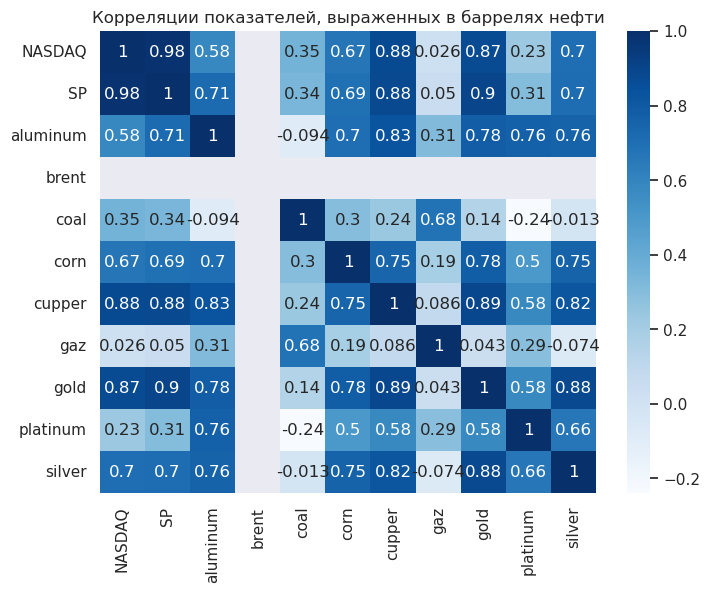

In [97]:
# граф корреляции средн мес знач выраж в баррелях нефти.

sns.set(rc = {'figure.figsize':(8,6)})
sns.heatmap(corr_brent, cmap='Blues', annot=True).set_title('Корреляции показателей, выраженных в баррелях нефти')

Октябрь 2022:

К корреляции в долл., затем в золоте добавляем корреляцию в барелях:


Уголь - Газ         0,90    --> 0,79    --> 0,70 

Золото - Серебро    0,85    --> ---     --> 0,93

Уголь - Зерно       0,83    --> 0,65    --> 0,18

Медь - Серебро      0,79    --> 0,37    --> 0,78

Нефть - Алюминий    0,76    --> 0,70    --> ---

Газ - Нефть         0,75    --> 0,64    --> ---

Газ - Зерно         0,75    --> 0,63    --> 0,4


А вот, что с платиной:

Платина - Серебро   0,36    --> 0,67    --> 0,80

Интерпритацию данных значений оставлю на последующий анализ и осмысление, что бы не попасть в ловушку "ложных корреляций" и поверхностного подхода.

июнь 2023:

Уголь - Газ         0,83    --> 0,71    --> 0,72 

             coal     gold      gaz  aluminum
coal      1.00000  0.14368  0.68374  -0.09430
gold      0.14368  1.00000  0.04331   0.78273
gaz       0.68374  0.04331  1.00000   0.31303
aluminum -0.09430  0.78273  0.31303   1.00000


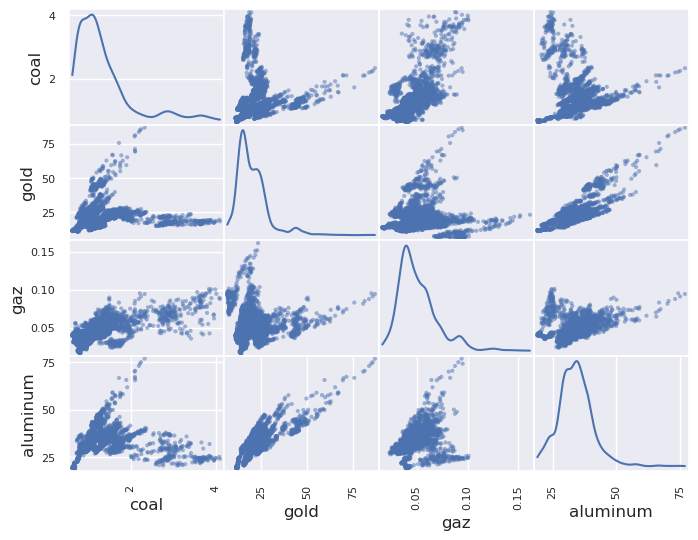

In [98]:
# Корреляция график scatter_matrix по отдельным временным рядам, выраженных в баррелях неефти.

df1_brent = df_brent[["coal", 'gold', "gaz", 'aluminum']]

print(df1_brent.corr())
pd.plotting.scatter_matrix(df1_brent, diagonal='kde'); # , diagonal='kde'

In [99]:
# Уголь в барелях нефти

# Временной ряд стоимости угля в унциях золота
coal_b = df_brent['coal']

coal_b.dropna(how='any', inplace=True)

coal_b


coal_b_rol180 = coal_b.rolling(180).mean()
coal_b_rol90 = coal_b.rolling(90).mean()
coal_b_rol30 = coal_b.rolling(30).mean()


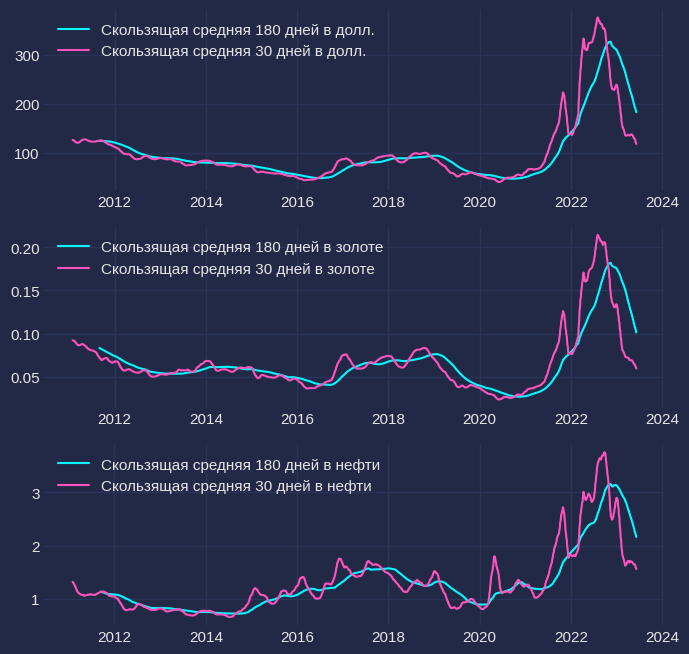

In [100]:
# Продолжение внлиза скользящих средних в сравнении


plt.style.use("cyberpunk")
plt.figure(figsize=(8, 8))
plt.subplot(311)
plt.plot(coal_rol180, label='Скользящая средняя 180 дней в долл.')
plt.plot(coal_rol30, label='Скользящая средняя 30 дней в долл.')
plt.legend()

plt.subplot(312)
plt.plot(coal_g_rol180, label='Скользящая средняя 180 дней в золоте')
plt.plot(coal_g_rol30, label='Скользящая средняя 30 дней в золоте')
plt.legend()

plt.subplot(313)
plt.plot(coal_b_rol180, label='Скользящая средняя 180 дней в нефти')
plt.plot(coal_b_rol30, label='Скользящая средняя 30 дней в нефти')
plt.legend()


plt.show()

In [101]:
# Нормализовываю знач в баррелях неефти.

# series:
series_scaler_brent = scalerMMS.fit_transform(df_brent)

series_scaler_brent

# DataFrame с нормализованными данными:
df_brent_scaler = pd.DataFrame(series_scaler_brent, index=df_brent.index)

df_brent_scaler.columns = col

df_brent_scaler

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2008-01-02,0.02682,0.04619,NaN,0.0,NaN,0.11258,0.05602,0.44105,0.02959,0.26156,0.07219
2008-01-03,0.02681,0.04645,NaN,0.0,NaN,0.11632,0.07031,0.43000,0.03105,0.26110,0.07611
2008-01-04,0.02493,0.04466,NaN,0.0,NaN,0.12008,0.06974,0.44641,0.03155,0.26439,0.07755
2008-01-07,0.02637,0.04775,NaN,0.0,NaN,0.12931,0.07672,0.46336,0.03391,0.27217,0.08099
2008-01-08,0.02414,0.04441,NaN,0.0,NaN,0.13493,0.08912,0.46278,0.03494,0.27575,0.08643
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,0.37282,0.34828,0.17587,0.0,0.23438,0.35366,0.24775,0.09021,0.23801,0.19228,0.30245
2023-06-06,0.37653,0.35152,0.17054,0.0,0.21648,0.36787,0.25128,0.09285,0.24098,0.19560,0.30580
2023-06-07,0.36770,0.34640,0.16681,0.0,0.22897,0.35865,0.24500,0.09710,0.23455,0.18611,0.29912


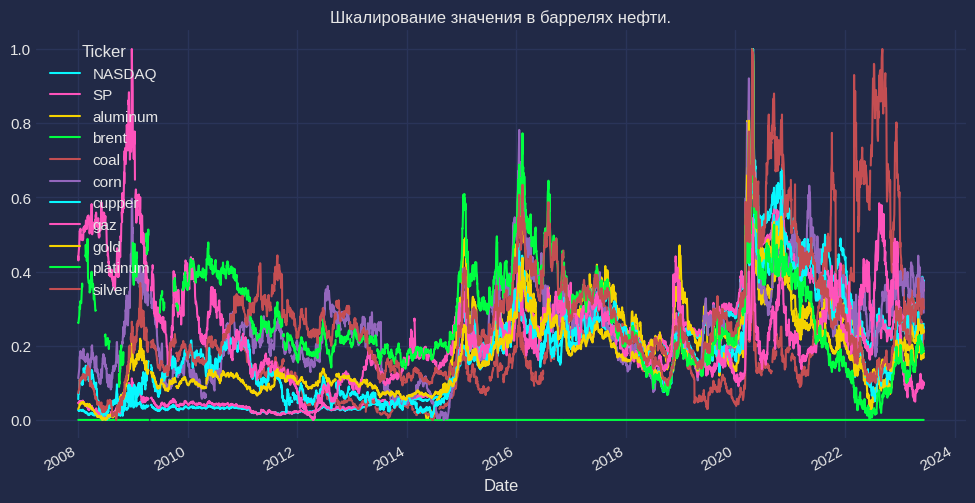

In [102]:
# График шкалированных значения временных рядов изначально выраженных в баррелях нефти.
# настройка графиков
plt.style.use("cyberpunk")
df_brent_scaler.plot(figsize=(12, 6), grid=True, title='Шкалирование значения в баррелях нефти.');

В расчете на беррель нефти график выглядит противоположно в сравнении с графиком в унции золота. Как мы помним одномоментнтно с началом COVID-19 стоимсоть барреля нефти снижалась практически до нуля и, следовательно, стоимость биржевых товаров взлетает до максимальных значений.

### 07. Представление шкалированной стоимости угля в разных ед.измерения
###### df2


<a href="#top">К оглавлению</a>

Ниже представленный график шкалированнаной стоимость угля в разных ед.измерения необходимо интерпретировать.

На обсуждение: м.б. стоит это использовать для последующего прогнозирования.

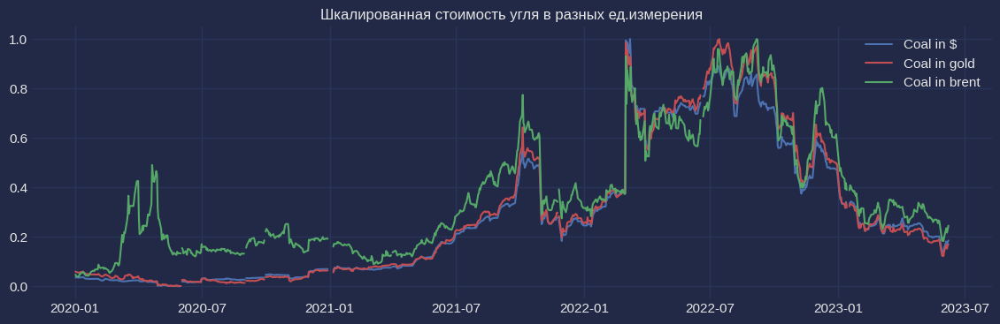

In [103]:
# График Шкалированнаной стоимость угля в разных ед.измерения
plt.figure(figsize=(14,4))
plt.plot(df_scaler['coal']['2020-01-01':], label='Coal in $', color='b')
plt.plot(df_gold_scaler['coal']['2020-01-01':], label='Coal in gold', color='r')
plt.plot(df_brent_scaler['coal']['2020-01-01':], label='Coal in brent', color='g')
plt.title('Шкалированная стоимость угля в разных ед.измерения')
plt.legend()
plt.show()

Обратите внимание на два "всплеска": начало COVID-19, и февраль-март 2022 - начало СВО России. Скоордиированный "всплеск" в октябре 2021 пока не проанализирован.  

In [104]:
# dataframe со шкалированной стоимостью угля при разных ед изм.
df2 = pd.concat([df_scaler['coal'], df_gold_scaler['coal'], df_brent_scaler['coal']], axis=1)

df2.columns = ['in_doll', 'in_gold', 'in_brent']

df2.dropna(how='any', inplace=True)

df2

,in_doll,in_gold,in_brent
Date,,,
2010-12-17,0.20992,0.32102,0.20307
2010-12-20,0.20992,0.31889,0.19864
2010-12-21,0.21180,0.32067,0.19908
2010-12-22,0.21743,0.32890,0.20416
2010-12-23,0.21680,0.33018,0.20094
...,...,...,...
2023-06-02,0.15526,0.14153,0.19898
2023-06-05,0.18078,0.16589,0.23438
2023-06-06,0.16740,0.15175,0.21648


#### 07.1 Корреляция стоимости угля выраженная в разных единицах измеренния
###### corr2


<a href="#top">К оглавлению</a>

In [105]:
# Корреляция стоимости угля выраженная в разных единицах измеренния

corr2 = df2.corr()
corr2

,in_doll,in_gold,in_brent
in_doll,1.00000,0.96926,0.85817
in_gold,0.96926,1.00000,0.83748
in_brent,0.85817,0.83748,1.00000


Text(0.5, 1.0, 'Корреляция стоимости угля выраженная в разных единицах измеренния')

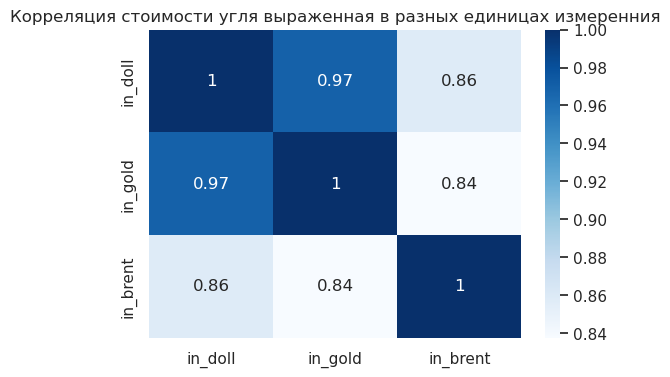

In [106]:
sns.set(rc = {'figure.figsize':(6,4)})
sns.heatmap(corr2, cmap='Blues', annot=True).set_title('Корреляция стоимости угля выраженная в разных единицах измеренния')

## <h2><a name="part_2"><b>Часть вторая</b></a></h2>

### 08. Построение прогнозов стоимости угля на основании использования библиотеки SKTIME
###### sktime



<a href="#top">К оглавлению</a>

#### 08.1 Метод прогнозирования SKTIME ARIMA

<a href="https://www.sktime.org/en/latest/api_reference/auto_generated/sktime.forecasting.arima.ARIMA.html">sktime ARIMA</a>

Прогноз только по самому временному ряду стоимости угля.


In [107]:
# Расчет прогноза по самому временному ряду стоимости угля

y_d = df_day['coal'] # ежедневные данные

y_d

Date
2008-01-02       NaN
2008-01-03       NaN
2008-01-04       NaN
2008-01-05       NaN
2008-01-06       NaN
               ...  
2023-06-05    110.85
2023-06-06    105.50
2023-06-07    109.75
2023-06-08    112.50
2023-06-09       NaN
Freq: D, Name: coal, Length: 5638, dtype: float64

In [108]:

forecaster = ARIMA()

# forecaster = AutoARIMA(sp=12, d=0, max_p=2, max_q=2, suppress_warnings=True)

# или так можно задать:
# forecaster.fit(y, fh=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

# задание периодов прогноза

fh = np.arange(1, 5)


# прогноз по дни
forecaster.fit(y_d)

y_pred_ARIMA_d = forecaster.predict(fh=fh)

y_pred_ARIMA_d



### 2023-06-09 
# oduleNotFoundError: ARIMA requires package 'pmdarima' to be present in the python environment, 
# but 'pmdarima' was not found. 'pmdarima' is a soft dependency and not included in the base sktime installation. 
# Please run: `pip install pmdarima` to install the pmdarima package. 
# To install all soft dependencies, run: `pip install sktime[all_extras]


2023-06-10    112.41548
2023-06-11    112.37348
2023-06-12    112.33164
2023-06-13    112.28997
Freq: D, Name: coal, dtype: float64

Прогноз от октября 2022:

2022-11-05    222.22353

2022-11-06    221.78808

2022-11-07    221.35449

2022-11-08    220.92274



Прогоз от 15 марта 2023:

2023-03-16    135.40383

2023-03-17    135.28157

2023-03-18    135.15985

2023-03-19    135.03866

Прогноз от 2023-06-09:

2023-06-10    112.41548
2023-06-11    112.37348
2023-06-12    112.33164
2023-06-13    112.28997

(<Figure size 1600x400 with 1 Axes>, <AxesSubplot:ylabel='coal'>)

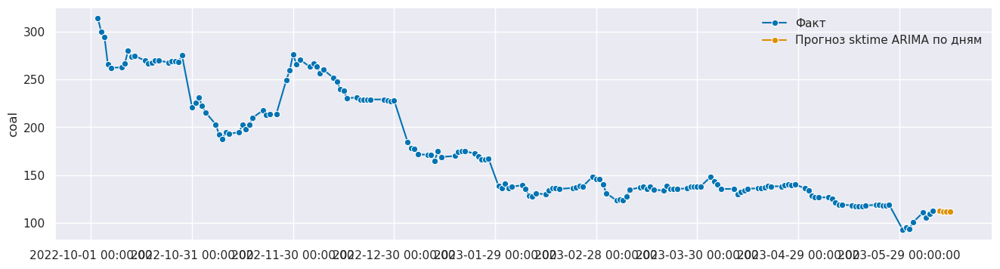

In [109]:
plot_series(y_d['2022-10-01':], y_pred_ARIMA_d, labels=["Факт", "Прогноз sktime ARIMA по дням"])


In [110]:
y_m = df_month['coal'] # ежемес данные

y_m

Date
2008-01-31          NaN
2008-02-29          NaN
2008-03-31          NaN
2008-04-30          NaN
2008-05-31          NaN
                ...    
2023-02-28    136.71053
2023-03-31    134.93043
2023-04-30    138.00474
2023-05-31    119.86045
2023-06-30    105.51667
Freq: M, Name: coal, Length: 186, dtype: float64

In [111]:
# прогноз по месяцы
forecaster.fit(y_m)

fh_m = np.arange(1, 4)

y_pred_ARIMA_m = forecaster.predict(fh=fh_m)

y_pred_ARIMA_m

2023-07-31    105.38935
2023-08-31    105.26898
2023-09-30    105.15516
Freq: M, Name: coal, dtype: float64

Прогноз по месяца от октября 2022:

2022-12-31    225.08039

2023-01-31    221.93905

2023-02-28    218.90548


Прогоз от 15 марта 2023:

2023-04-30    128.35539

2023-05-31    126.93890

2023-06-30    125.60092


Прогноз от 2023-06-09:


2023-07-31    105.38935
2023-08-31    105.26898
2023-09-30    105.15516

(<Figure size 1600x400 with 1 Axes>, <AxesSubplot:ylabel='coal'>)

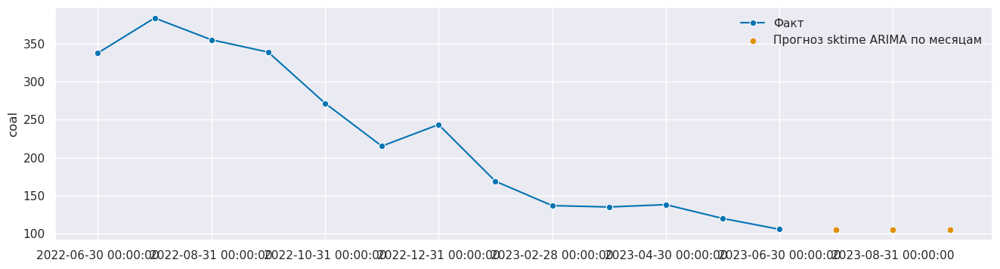

In [112]:
plot_series(y_m['2022-06-01':], y_pred_ARIMA_m, labels=["Факт", "Прогноз sktime ARIMA по месяцам"])

In [113]:
# forecaster.forecasters_

In [114]:
# вероятностный прогноз
coverage = 0.2
y_pred_ints = forecaster.predict_interval(coverage=coverage)
y_pred_ints

Coverage           
                  0.2           
                lower      upper
2023-07-31  100.23679  110.54192
2023-08-31   98.17787  112.36008
2023-09-30   96.69923  113.61108

Пргноз от октября 2022:

2022-12-31	219.76729	    230.39348

2023-01-31	214.55297	    229.32513

2023-02-28	210.01143	    227.79952



Прогноз от 15 марта 2023:

2023-04-30	123.52096	    133.18981

2023-05-31	120.28877	    133.58902

2023-06-30	117.67445	    133.52740


Прогноз от 2023-06-09:

2023-07-31	100.23679	110.54192
2023-08-31	98.17787	112.36008
2023-09-30	96.69923	113.61108



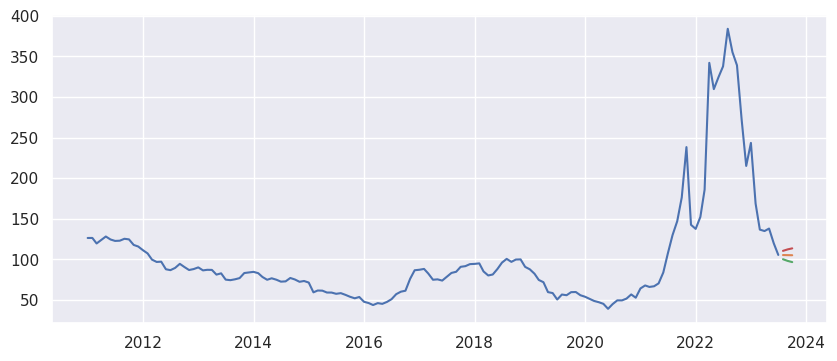

In [115]:
plt.figure(figsize=(10, 4))
plt.plot(y_m)
plt.plot(y_pred_ARIMA_m)
plt.plot(y_pred_ints)
plt.show()



predict_quantiles - квантильные прогнозы
sktime предлагает predict_quantiles в качестве унифицированного интерфейса для возврата квантильных значений прогнозов. Аналогично predict_interval.

predict_quantiles имеет аргумент alpha, содержащий запрашиваемые значения квантилей. Подобно случаю с predict_interval, alpha может быть значением с плавающей точкой или списком значений с плавающей точкой.

In [116]:
y_pred_quantiles = forecaster.predict_quantiles(alpha=[0.275, 0.975])
y_pred_quantiles

Quantiles           
               0.275      0.975
2023-07-31  93.23212  145.25105
2023-08-31  88.53786  160.12774
2023-09-30  85.20381  170.57258

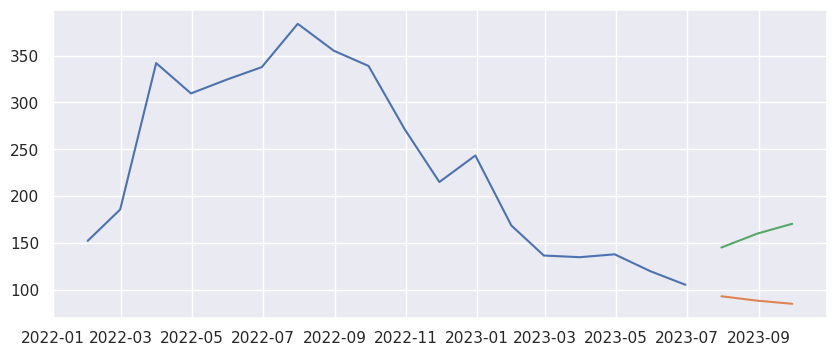

In [117]:
plt.figure(figsize=(10, 4))
plt.plot(y_m['2022-01-01':])
plt.plot(y_pred_quantiles)
plt.show()


In [118]:
# predict_var выдает предсказания дисперсии:
y_pred_var = forecaster.predict_var()
y_pred_var

,0
2023-07-31,413.63319
2023-08-31,783.42207
2023-09-30,1114.01406


In [119]:
# predict_proba - прогнозы распределения
y_pred_proba = forecaster.predict_proba()
y_pred_proba

Normal(columns=Index(['coal'], dtype='object'),
       index=DatetimeIndex(['2023-07-31', '2023-08-31', '2023-09-30'], dtype='datetime64[ns]', freq='M'),
       mu=                 coal
2023-07-31  105.38935
2023-08-31  105.26898
2023-09-30  105.15516,
       sigma=                   0
2023-07-31  20.33797
2023-08-31  27.98968
2023-09-30  33.37685)

#### 08.2 Sktime. Метод прогнозирования VAR (векторная авторегрессия) в долл.

###### sktime.var


<a href="#top">К оглавлению</a>

In [120]:
# Напоминание:
# df со средн мес знач в долл.
# df_month

# df со средн мес знач в золоте.
# df_gold_month

# df со средн мес знач в нефти.
# df_brent_month

In [121]:
# Создание df со средн дневн и сред мес значениями

y_m = df_month['2015-01-01':] # ежемес знач
y_d = df_day['2015-01-01':] # ежедн знач

In [122]:


df_day1 = df_day.dropna(how='any')
df_day1.fillna(0, inplace=True)

y_d1 = df_day1['2015-01-01':] # ежедн знач без пропусков


/tmp/ipykernel_26626/3963326005.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_day1.fillna(0, inplace=True)


In [123]:
# df среднемес знач
y_m

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2015-01-31,4673.70149,2028.17851,2220.80000,49.68000,59.47632,388.10000,2.65322,2.92935,1252.92499,1245.72000,17.20000
2015-02-28,4854.25583,2082.19579,2174.71053,58.44053,61.71176,383.68421,2.62363,2.75495,1224.91052,1199.63684,16.72021
2015-03-31,4938.01045,2079.99044,2056.14773,56.93500,61.54950,382.94318,2.70793,2.74691,1177.76818,1140.41363,16.19436
2015-04-30,4985.95143,2094.86284,2005.79762,60.96524,59.24471,373.96429,2.75276,2.59133,1199.82858,1154.72381,16.32014
2015-05-31,5029.43147,2111.94352,1953.55000,65.60100,59.20000,359.23750,2.89338,2.85595,1198.21501,1141.61501,16.79985
...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28,11785.07432,4079.68472,2424.82895,83.50947,136.71053,671.09211,4.08824,2.43747,1853.23685,951.63684,21.89637
2023-03-31,11637.09222,3968.55915,2314.63043,79.20696,134.93043,637.39130,4.04915,2.40778,1912.96087,973.03478,21.97178
2023-04-30,12073.46474,4121.46736,2357.92105,83.36895,138.00474,654.88158,4.00037,2.19726,2001.04736,1054.50527,25.09232


In [124]:
y_m.isna().sum()

Ticker
NASDAQ      0
SP          0
aluminum    0
brent       0
coal        0
corn        0
cupper      0
gaz         0
gold        0
platinum    0
silver      0
dtype: int64

In [125]:
# y_m.dropna(how='any', inplace=True)

y_m.fillna(0, inplace=True)

/tmp/ipykernel_26626/268557846.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_m.fillna(0, inplace=True)


In [126]:
# y_m.info()

# y_m.isna().sum()
y_m.index

DatetimeIndex(['2015-01-31', '2015-02-28', '2015-03-31', '2015-04-30',
               '2015-05-31', '2015-06-30', '2015-07-31', '2015-08-31',
               '2015-09-30', '2015-10-31',
               ...
               '2022-09-30', '2022-10-31', '2022-11-30', '2022-12-31',
               '2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30',
               '2023-05-31', '2023-06-30'],
              dtype='datetime64[ns]', name='Date', length=102, freq='M')

In [127]:
# df дневн знач с пропусками 
y_d

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2015-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-02,4726.81006,2058.19995,2168.50,56.42,NaN,395.75,2.8385,3.003,1186.00000,1203.00000,15.734
2015-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,4652.56982,2020.57996,2148.25,53.11,63.65,406.00,2.7930,2.882,1203.90002,1210.09998,16.179
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,13229.42969,4273.79004,2240.50,76.71,110.85,597.50,3.7625,2.245,1958.00000,1044.50000,23.534
2023-06-06,13276.41992,4283.85010,2204.75,76.29,105.50,608.00,3.7670,2.262,1965.50000,1046.80005,23.574
2023-06-07,13104.90039,4267.52002,2207.25,76.95,109.75,604.25,3.7545,2.329,1942.69995,1032.69995,23.439


In [128]:
y_d.info()
# y_d.isna().sum()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3082 entries, 2015-01-01 to 2023-06-09
Freq: D
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   NASDAQ    2123 non-null   float64
 1   SP        2123 non-null   float64
 2   aluminum  2086 non-null   float64
 3   brent     2120 non-null   float64
 4   coal      2072 non-null   float64
 5   corn      2120 non-null   float64
 6   cupper    2124 non-null   float64
 7   gaz       2125 non-null   float64
 8   gold      2123 non-null   float64
 9   platinum  2106 non-null   float64
 10  silver    2121 non-null   float64
dtypes: float64(11)
memory usage: 288.9 KB


In [129]:
# df дневн знач без пропусков 
y_d1.fillna(0, inplace=True)
y_d1

/tmp/ipykernel_26626/740862418.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_d1.fillna(0, inplace=True)


Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2015-01-05,4652.56982,2020.57996,2148.25,53.11,63.65,406.00,2.7930,2.882,1203.90002,1210.09998,16.179
2015-01-06,4592.74023,2002.60999,2144.50,51.10,62.70,405.00,2.8040,2.938,1219.30005,1220.80005,16.603
2015-01-07,4650.47021,2025.90002,2165.00,51.15,60.90,396.25,2.7960,2.871,1210.59998,1220.69995,16.510
2015-01-08,4736.18994,2062.13989,2202.75,50.96,60.60,394.25,2.8070,2.927,1208.40002,1221.69995,16.351
2015-01-09,4704.06982,2044.81006,2189.00,50.11,60.15,400.25,2.7905,2.946,1216.00000,1229.09998,16.386
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-02,13240.76953,4282.37012,2269.50,76.13,100.65,609.00,3.7225,2.172,1952.40002,1011.59998,23.643
2023-06-05,13229.42969,4273.79004,2240.50,76.71,110.85,597.50,3.7625,2.245,1958.00000,1044.50000,23.534
2023-06-06,13276.41992,4283.85010,2204.75,76.29,105.50,608.00,3.7670,2.262,1965.50000,1046.80005,23.574


In [130]:
# y_d1.info()
y_d1.isna().sum()
# y_d1.index


Ticker
NASDAQ      0
SP          0
aluminum    0
brent       0
coal        0
corn        0
cupper      0
gaz         0
gold        0
platinum    0
silver      0
dtype: int64

In [131]:
y_d1.asfreq('D')

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2015-01-05,4652.56982,2020.57996,2148.25,53.11,63.65,406.00,2.7930,2.882,1203.90002,1210.09998,16.179
2015-01-06,4592.74023,2002.60999,2144.50,51.10,62.70,405.00,2.8040,2.938,1219.30005,1220.80005,16.603
2015-01-07,4650.47021,2025.90002,2165.00,51.15,60.90,396.25,2.7960,2.871,1210.59998,1220.69995,16.510
2015-01-08,4736.18994,2062.13989,2202.75,50.96,60.60,394.25,2.8070,2.927,1208.40002,1221.69995,16.351
2015-01-09,4704.06982,2044.81006,2189.00,50.11,60.15,400.25,2.7905,2.946,1216.00000,1229.09998,16.386
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-06-05,13229.42969,4273.79004,2240.50,76.71,110.85,597.50,3.7625,2.245,1958.00000,1044.50000,23.534
2023-06-06,13276.41992,4283.85010,2204.75,76.29,105.50,608.00,3.7670,2.262,1965.50000,1046.80005,23.574


In [132]:
# y_d1.index
y_d1.isna().sum()

Ticker
NASDAQ      0
SP          0
aluminum    0
brent       0
coal        0
corn        0
cupper      0
gaz         0
gold        0
platinum    0
silver      0
dtype: int64

In [133]:
# df для обучения беру без последних 2 значений
i = 2

y_m_train = y_m[:-i]

y_m_train

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2015-01-31,4673.70149,2028.17851,2220.80000,49.68000,59.47632,388.10000,2.65322,2.92935,1252.92499,1245.72000,17.20000
2015-02-28,4854.25583,2082.19579,2174.71053,58.44053,61.71176,383.68421,2.62363,2.75495,1224.91052,1199.63684,16.72021
2015-03-31,4938.01045,2079.99044,2056.14773,56.93500,61.54950,382.94318,2.70793,2.74691,1177.76818,1140.41363,16.19436
2015-04-30,4985.95143,2094.86284,2005.79762,60.96524,59.24471,373.96429,2.75276,2.59133,1199.82858,1154.72381,16.32014
2015-05-31,5029.43147,2111.94352,1953.55000,65.60100,59.20000,359.23750,2.89338,2.85595,1198.21501,1141.61501,16.79985
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31,10838.99581,3912.38095,2436.09524,81.34143,243.41905,650.85714,3.81645,5.76805,1797.11429,1032.34761,23.36152
2023-01-31,11013.99097,3960.65653,2534.83750,83.89619,168.75250,670.38750,4.12321,3.43243,1900.43333,1050.99047,23.72095
2023-02-28,11785.07432,4079.68472,2424.82895,83.50947,136.71053,671.09211,4.08824,2.43747,1853.23685,951.63684,21.89637


In [134]:
# df для тестирования беру последние i значений

y_m_test = y_m[-i:]

y_m_test

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-05-31,12446.53050,4146.17320,2284.15909,75.63227,119.86045,608.90909,3.74173,2.29932,1993.42273,1066.60000,24.30314
2023-06-30,13198.50326,4270.41341,2244.14286,76.07428,105.51667,593.21429,3.76114,2.25600,1963.09999,1027.68571,23.82986


In [135]:
# y_m_train.index
y_m_test.index

DatetimeIndex(['2023-05-31', '2023-06-30'], dtype='datetime64[ns]', name='Date', freq='M')

In [136]:
# прогноз VAR на train для следующих i периодов
fh=[1, 2] 
forecaster = VAR()
forecaster.fit(y_m_train, fh=fh) # y_m_train
y_m_pred = forecaster.predict()
y_m_pred

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-05-31,12356.03401,4163.85714,2320.69926,82.47391,139.48830,648.95043,3.95734,2.66868,2034.20257,1027.24196,25.08633
2023-06-30,12605.97197,4196.86109,2282.52453,81.67902,145.56486,641.98883,3.91464,2.90323,2061.92958,1008.35977,25.14589


In [137]:
# Прогноз от октября 2022

# Ticker	NASDAQ	SP	aluminum	brent	coal	corn	cupper	gaz	gold	platinum	silver
# 2022-10-31	11022.47480	3747.62382	2054.62424	83.10507	298.17192	665.47727	3.31883	7.49401	1660.98394	879.93192	18.12086
# 2022-11-30	10653.74568	3639.38105	1907.67892	76.07661	280.64174	645.59887	3.17064	7.10013	1655.63304	889.65533	17.71014

# Прогноз от 15 октября 2023:


# Ticker	NASDAQ	SP	aluminum	brent	coal	corn	cupper	gaz	gold	platinum	silver
# 2023-02-28	11064.81593	3944.29704	2516.89268	87.82867	164.75180	648.04233	4.01485	3.73618	1958.93956	1026.58754	23.73452
# 2023-03-31	11149.86778	3922.83904	2463.51579	89.88762	172.29638	622.62755	3.87488	4.15659	1994.79756	994.66941	23.67449



# Прогноз от 2023-06-09:
# Ticker	NASDAQ	SP	aluminum	brent	coal	corn	cupper	gaz	gold	platinum	silver
# Date											
# 2023-05-31	12356.03401	4163.85714	2320.69926	82.47391	139.48830	648.95043	3.95734	2.66868	2034.20257	1027.24196	25.08633
# 2023-06-30	12605.97197	4196.86109	2282.52453	81.67902	145.56486	641.98883	3.91464	2.90323	2061.92958	1008.35977	25.14589

In [138]:
df_delta = y_m_test - y_m_pred
df_delta

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-05-31,90.49649,-17.68394,-36.54017,-6.84163,-19.62784,-40.04134,-0.21561,-0.36936,-40.77984,39.35804,-0.78319
2023-06-30,592.53128,73.55232,-38.38168,-5.60473,-40.04819,-48.77455,-0.15350,-0.64723,-98.82959,19.32594,-1.31603


In [139]:
df_delta_pr = (df_delta / y_m_test * 100).round(2)

df_delta_pr

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-05-31,0.73,-0.43,-1.60,-9.05,-16.38,-6.58,-5.76,-16.06,-2.05,3.69,-3.22
2023-06-30,4.49,1.72,-1.71,-7.37,-37.95,-8.22,-4.08,-28.69,-5.03,1.88,-5.52


In [140]:
# прогноз VAR на полном df

fh=[1, 2] 
forecaster = VAR()
forecaster.fit(y_m, fh=fh)
y_m_pred1 = forecaster.predict()
y_m_pred1

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-07-31,13350.77650,4283.39856,2258.76563,73.89278,107.08065,594.02277,3.77979,2.46702,1996.83329,1015.03554,24.04477
2023-08-31,13516.83918,4300.02250,2268.76627,72.98364,112.73601,595.87102,3.80990,2.59866,2030.39590,1009.16426,24.37350


In [141]:
# Прогноз от октября 2022

# Ticker	NASDAQ	SP	aluminum	brent	coal	corn	cupper	gaz	gold	platinum	silver
# 2022-12-31	10095.38815	3653.12931	2207.13735	91.36506	227.72750	656.21026	3.30284	5.92458	1630.71689	927.29568	18.81098
# 2023-01-31	9622.75128	3525.90529	2129.62842	87.41021	225.74037	628.53211	3.13392	5.79529	1625.34470	912.38111	18.21636


# Прогноз от 15 октября 2023:

# Ticker	NASDAQ	SP	aluminum	brent	coal	corn	cupper	gaz	gold	platinum	silver
# 2023-04-30	11678.61052	3958.30899	2285.67372	81.95777	128.63773	594.41993	3.89382	2.72105	1888.70078	943.52230	20.97088
# 2023-05-31	11925.07310	3966.62690	2236.61238	80.66609	131.30668	562.18753	3.75486	2.88779	1911.46634	921.55002	21.07172



# Прогноз от 2023-06-09:
# Ticker	NASDAQ	SP	aluminum	brent	coal	corn	cupper	gaz	gold	platinum	silver
# Date											
# 2023-07-31	13349.03776	4282.96826	2258.71315	73.88578	107.08447	593.86030	3.77808	2.46909	1996.56001	1015.23659	24.03900
# 2023-08-31	13513.72796	4299.25512	2268.67219	72.97452	112.75701	595.76091	3.80837	2.60059	2030.11958	1009.32738	24.36763

Факт ст-ть угля:  Date
2023-05-31    120.0
2023-06-30    106.0
Freq: M, Name: coal, dtype: float64
----
Прогноз ст-ти угля:  Date
2023-07-31    107.0
2023-08-31    113.0
Name: coal, dtype: float64


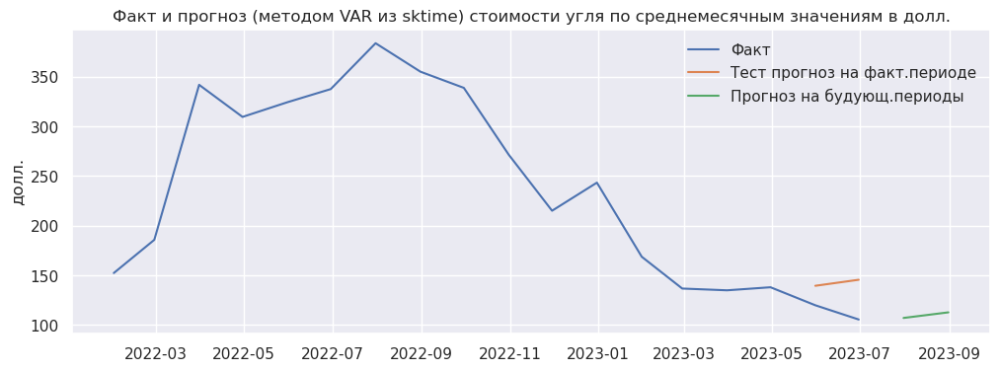

In [142]:
print('Факт ст-ть угля: ', (y_m['coal'][-2:]).round(0))
print('----')
print('Прогноз ст-ти угля: ', (y_m_pred1['coal']).round(0))

plt.figure(figsize=(12, 4))
plt.plot(y_m['coal']['2022-01-01':], label='Факт')
plt.plot(y_m_pred['coal'], label='Тест прогноз на факт.периоде')
plt.plot(y_m_pred1['coal'], label='Прогноз на будующ.периоды')
plt.title('Факт и прогноз (методом VAR из sktime) стоимости угля по среднемесячным значениям в долл.')
plt.ylabel('долл.')
plt.legend()
plt.show()


In [143]:
# Prophet. Прогноз по дневным значениям
# обучение по всему дневн df не очищен
# y_d

# 2023-06-09 переустанавливал ptophet

In [144]:


# убавил период. (Оказывается чем меньше период обучения тем лучше точность к реальности)
y_d = y_d['2022-01-01':]

y_d

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2022-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-03,15832.79980,4796.56006,2752.50,78.98,136.73,589.25,4.4145,3.815,1799.40002,953.70001,22.790
2022-01-04,15622.71973,4793.54004,2802.75,80.00,136.73,609.50,4.4660,3.717,1814.00000,970.40002,23.038
2022-01-05,15100.16992,4700.58008,2876.00,80.80,136.73,602.25,4.4045,3.882,1824.59998,1001.90002,23.150
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-05,13229.42969,4273.79004,2240.50,76.71,110.85,597.50,3.7625,2.245,1958.00000,1044.50000,23.534
2023-06-06,13276.41992,4283.85010,2204.75,76.29,105.50,608.00,3.7670,2.262,1965.50000,1046.80005,23.574
2023-06-07,13104.90039,4267.52002,2207.25,76.95,109.75,604.25,3.7545,2.329,1942.69995,1032.69995,23.439


In [149]:
# удаляю nan

y_d.dropna(inplace=True)

y_d

/tmp/ipykernel_26626/110174999.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_d.dropna(inplace=True)


Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2022-01-03,15832.79980,4796.56006,2752.50,78.98,136.73000,589.25,4.4145,3.815,1799.40002,953.70001,22.790
2022-01-04,15622.71973,4793.54004,2802.75,80.00,136.73000,609.50,4.4660,3.717,1814.00000,970.40002,23.038
2022-01-05,15100.16992,4700.58008,2876.00,80.80,136.73000,602.25,4.4045,3.882,1824.59998,1001.90002,23.150
2022-01-06,15080.86035,4696.04980,2890.00,81.99,143.14999,603.75,4.3480,3.812,1788.69995,960.59998,22.174
2022-01-07,14935.90039,4677.02979,2884.50,81.75,138.50000,606.75,4.4030,3.916,1797.00000,957.00000,22.394
...,...,...,...,...,...,...,...,...,...,...,...
2023-06-02,13240.76953,4282.37012,2269.50,76.13,100.65000,609.00,3.7225,2.172,1952.40002,1011.59998,23.643
2023-06-05,13229.42969,4273.79004,2240.50,76.71,110.85000,597.50,3.7625,2.245,1958.00000,1044.50000,23.534
2023-06-06,13276.41992,4283.85010,2204.75,76.29,105.50000,608.00,3.7670,2.262,1965.50000,1046.80005,23.574


In [152]:
y_d.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 360 entries, 2022-01-03 to 2023-06-08
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   NASDAQ    360 non-null    float64
 1   SP        360 non-null    float64
 2   aluminum  360 non-null    float64
 3   brent     360 non-null    float64
 4   coal      360 non-null    float64
 5   corn      360 non-null    float64
 6   cupper    360 non-null    float64
 7   gaz       360 non-null    float64
 8   gold      360 non-null    float64
 9   platinum  360 non-null    float64
 10  silver    360 non-null    float64
dtypes: float64(11)
memory usage: 33.8 KB


In [150]:
# forecaster = Prophet(add_country_holidays={'country_name': 'US'})
forecaster = Prophet()

In [151]:
# обучение на y_d 
fh=[1, 2, 3, 4, 5] 
forecaster.fit(y_d, fh=fh)
y_Prophet = forecaster.predict()

y_Prophet


# ValueError: Prophet cannot handle missing data (nans), but y passed contained missing data.
# убрал выше nan

# теперь:
# ValueError: _coerce_to_period requires freq argument to be passed if x is pd.Timestamp


15:14:00 - cmdstanpy - INFO - Chain [1] start processing
15:14:00 - cmdstanpy - INFO - Chain [1] done processing
15:14:00 - cmdstanpy - INFO - Chain [1] start processing
15:14:00 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1] done processing
15:14:01 - cmdstanpy - INFO - Chain [1] start processing
15:14:01 - cmdstanpy - INFO - Chain [1]

ValueError: _coerce_to_period requires freq argument to be passed if x is pd.Timestamp

In [147]:
print('Факт ст-ть угля: ', (y_d['coal'][-5:]).round(0))
print('----')
print('Прогноз ст-ти угля: ', y_Prophet['coal'].round(0))

plt.figure(figsize=(12, 4))
plt.plot(y_d['coal']['2022-09-01':], label='Факт')
plt.plot(y_Prophet['coal'], label='Прогноз на будующ.дни')
plt.title('Факт и прогноз (методом Prophet из sktime) стоимости угля по ежедневным значениям в долл.')
plt.ylabel('долл.')
plt.legend()
plt.show()

Факт ст-ть угля:  Date
2023-06-05    111.0
2023-06-06    106.0
2023-06-07    110.0
2023-06-08    112.0
2023-06-09      NaN
Freq: D, Name: coal, dtype: float64
----


NameError: name 'y_Prophet' is not defined

In [148]:
# Прогноз от октября 2022:

# Факт ст-ть угля:  Date
# 2022-10-31    218.0
# 2022-11-01    227.0
# 2022-11-02    235.0
# 2022-11-03    223.0
# 2022-11-04      NaN
# Freq: D, Name: coal, dtype: float64
# ----
# Прогноз ст-ти угля:  Date
# 2022-11-05    250.0
# 2022-11-06    249.0
# 2022-11-07    250.0
# 2022-11-08    253.0
# 2022-11-09    255.0
# Name: coal, dtype: float64


# Прогноз от 15 октября 2023:

# Факт ст-ть угля:  Date
# 2023-03-11      NaN
# 2023-03-12      NaN
# 2023-03-13    138.0
# 2023-03-14    136.0
# 2023-03-15      NaN
# Freq: D, Name: coal, dtype: float64
# ----
# Прогноз ст-ти угля:  Date
# 2023-03-16    115.0
# 2023-03-17    114.0
# 2023-03-18    112.0
# 2023-03-19    111.0
# 2023-03-20    112.0
# Name: coal, dtype: float64

In [171]:
# Прогноз VAR на основе фактических значений
# горизонт планирования периодов
# fh=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 
fh=[1, 2, 3, 4]

# forecaster = VAR() # Векторная авторегрессия (VAR) - пока у меня работает только с мес данными
forecaster = VARMAX() # Скользящее среднее векторной авторегрессии с экзогенными регрессорами (VARMAX) - пока у меня работает только с мес данными
# VARMAX дает в прогнозе не линейные значения

# тест других методов
# forecaster = NaiveForecaster(strategy="last") # самый примитивный метод, но работает и с дневн и с мес данными

# Prophet - Прямой интерфейс к Facebook prophet, 
# forecaster = Prophet(add_country_holidays={'country_name': 'US'}) # работает по дневн не очишен данным, по месячн данным тоже работает

# BATS - прогнозирования временных рядов с несколькими сезонными периодами. 
# Например, ежедневные данные могут иметь недельную структуру, а также годовую структуру. 
# Или почасовые данные могут иметь три сезонных периода: дневной шаблон, недельный шаблон и годовой шаблон.
# forecaster = BATS() # use_box_cox=False, use_trend=False

# forecaster = TBATS() # звгружался 1m44s на месячн базе, а на ежеднев более 9 мин и пришлось прервать. А 2022-11-05 2m11s

# forecaster.fit(y_m, fh=fh)

forecaster.fit(y_m, fh=fh)

y_pred = forecaster.predict()

# Прогноз
y_pred

/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:


,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
2023-04-30,11640.02791,3942.10884,2275.61184,82.10717,129.38881,595.05459,3.87903,2.77294,1889.86127,946.84114,21.08658
2023-05-31,11845.03104,3934.17811,2213.90267,80.76987,133.05324,563.13456,3.72361,2.99629,1911.02372,927.40828,21.26694
2023-06-30,12043.88138,3928.97738,2154.83897,78.60309,138.40363,538.29853,3.59366,3.24219,1923.76574,912.01765,21.49225
2023-07-31,12233.15436,3928.45384,2104.59682,76.00713,143.79208,520.83341,3.49609,3.46836,1930.84045,903.00980,21.76614


In [ ]:
# На пямять 
# 2022-10-20. по  трем рядам:
# # 	            Coal	Brent	    Gold
# 2022-11-30	272.69291	92.47655	1657.37476
# 2022-12-31	268.61807	91.83263	1638.34772
# 2023-01-31	264.33294	91.11984	1619.81774
# 2023-02-28	259.85443	90.34627	1601.82585
# 2023-03-31	255.20074	89.51960	1584.40906
# 2023-04-30	250.39104	88.64712	1567.60040

# 2022-10-20. по всем рядам:

#               Coal	    Brent	    Gaz	    CIF	        Cupper	Aluminum	Corn	    Gold	    Silver	    Platinum
# 2022-11-30	278.51078	90.10824	6.40390	624.15856	3.27129	2181.16557	656.45960	1660.02055	19.14351	915.76721
# 2022-12-31	271.28798	86.40798	6.37083	601.70529	3.11549	2066.02885	627.73800	1640.13558	18.86319	913.74078
# 2023-01-31	259.15069	82.21828	6.24090	576.98579	2.97697	1956.76288	599.28537	1617.74671	18.62519	913.76021
# 2023-02-28	243.81680	77.75496	6.02632	550.89029	2.85350	1857.24931	571.35782	1594.08351	18.43345	915.94197
# 2023-03-31	226.42440	73.19799	5.75186	524.34476	2.74478	1769.26398	544.35809	1570.15620	18.28941	919.80213
# 2023-04-30	207.86491	68.69625	5.43931	498.15033	2.65100	1693.74029	518.67043	1546.70298	18.19155	924.87450


# 2022-10-21. по всем рядам без отсечения на тестовую выборку:
#               Coal	    Brent	    Gaz	    CIF	        Cupper	Aluminum	Corn	    Gold	    Silver	    Platinum
# 2022-07-31	307.44137	114.74799	7.82053	758.71164	3.85559	2254.91821	702.50093	1813.47498	20.92268	942.19779
# 2022-08-31	278.81280	110.27231	7.60795	728.33979	3.58198	2009.22623	639.56431	1790.63340	20.49512	957.52200
# 2022-09-30	248.94660	104.57395	7.21645	691.40563	3.31647	1803.88100	576.70388	1765.25897	20.17657	980.85513
# 2022-10-31	218.44355	98.03869	6.73613	650.67459	3.06963	1634.33081	517.41405	1737.72017	19.95271	1006.65095
# 2022-11-30	188.41017	91.03224	6.21265	608.34566	2.84944	1499.16640	463.75300	1708.61837	19.81099	1032.48175
# 2022-12-31	159.82434	83.87881	5.67616	566.22282	2.66125	1396.93392	416.95419	1678.57537	19.73826	1056.92893


# 2022-10-27
# Coal	Brent	Gaz	CIF	Cupper	Aluminum	Corn	Gold	Silver	Platinum
# 2022-07-31	307.44137	114.74799	7.82053	758.71164	3.85559	2254.91821	702.50093	1813.47498	20.92268	942.19779
# 2022-08-31	278.81280	110.27231	7.60795	728.33979	3.58198	2009.22623	639.56431	1790.63340	20.49512	957.52200
# 2022-09-30	248.94660	104.57395	7.21645	691.40563	3.31647	1803.88100	576.70388	1765.25897	20.17657	980.85513
# 2022-10-31	218.44355	98.03869	6.73613	650.67459	3.06963	1634.33081	517.41405	1737.72017	19.95271	1006.65095
# 2022-11-30	188.41017	91.03224	6.21265	608.34566	2.84944	1499.16640	463.75300	1708.61837	19.81099	1032.48175
# 2022-12-31	159.82434	83.87881	5.67616	566.22282	2.66125	1396.93392	416.95419	1678.57537	19.73826	1056.92893
# 2023-01-31	133.43169	76.85404	5.14877	525.76248	2.50797	1325.65445	377.66764	1648.17938	19.72098	1079.05473
# 2023-02-28	109.75782	70.18354	4.64702	488.10131	2.39054	1282.88060	346.10239	1617.96807	19.74573	1098.23877
# 2023-03-31	89.14081	64.04429	4.18310	454.08415	2.30821	1265.82231	322.13231	1588.42117	19.79973	1114.10257
# 2023-04-30	71.76280	58.56750	3.76561	424.29373	2.25899	1271.45684	305.38029	1559.95633	19.87118	1126.45938

# 2022-10-28

#               Coal        Brent       Gaz     CIF         Cupper  Aluminum    Corn        Gold        Silver	    SP500	    NASDAQ
# 2022-09-30	342.36960	91.15517	8.34027	629.27461	3.47457	2302.32993	582.91869	1733.71871	18.62853	4174.62255	12733.31299
# 2022-10-31	324.81336	84.29409	7.90478	589.33957	3.35728	2223.33888	544.42214	1711.85291	17.86060	4194.18297	12902.14092
# 2022-11-30	305.71279	77.74800	7.43947	552.08131	3.26684	2168.67540	515.35346	1698.56794	17.29784	4212.08326	13056.26888


# 2022-10-31

#             Coal	    Brent	    Gaz	    CIF	      Cupper	Aluminum	  Corn	    Gold	      Silver	  SP500	      NASDAQ
# 2022-09-30	342.36960	91.15517	8.34027	629.27461	3.47457	2302.32993	582.91869	1733.71871	18.62853	4174.62255	12733.31299
# 2022-10-31	324.81336	84.29409	7.90478	589.33957	3.35728	2223.33888	544.42214	1711.85291	17.86060	4194.18297	12902.14092
# 2022-11-30	305.71279	77.74800	7.43947	552.08131	3.26684	2168.67540	515.35346	1698.56794	17.29784	4212.08326	13056.26888

# 2022-11-05
# Ticker	    NASDAQ	S   P	        aluminum	brent	    coal	    corn	    cupper	gaz	    gold	    platinum	silver
# 2022-12-31	10095.38815	3653.12931	2207.13735	91.36506	227.72750	656.21026	3.30284	5.92458	1630.71689	927.29568	18.81098
# 2023-01-31	9622.75128	3525.90529	2129.62842	87.41021	225.74037	628.53211	3.13392	5.79529	1625.34470	912.38111	18.21636
# 2023-02-28	9193.33114	3403.79872	2043.46381	83.60706	222.29960	602.86774	2.98219	5.63752	1623.57497	901.26246	17.79960
# 2023-03-31	8820.28654	3290.82279	1950.45930	79.82374	217.30492	578.44394	2.84331	5.45858	1623.47577	893.24839	17.53051


# Прогноз от 15 марта 2023:

#               NASDAQ      SP         aluminum    brent       coal        corn        cupper	    gaz	gold	    platinum	silver
# 2023-04-30	11640.02791	3942.10884	2275.61184	82.10717	129.38881	595.05459	3.87903	2.77294	1889.86127	946.84114	21.08658
# 2023-05-31	11845.03104	3934.17811	2213.90267	80.76987	133.05324	563.13456	3.72361	2.99629	1911.02372	927.40828	21.26694
# 2023-06-30	12043.88138	3928.97738	2154.83897	78.60309	138.40363	538.29853	3.59366	3.24219	1923.76574	912.01765	21.49225
# 2023-07-31	12233.15436	3928.45384	2104.59682	76.00713	143.79208	520.83341	3.49609	3.46836	1930.84045	903.00980	21.76614

Date
2021-08-31     87.15682
2021-09-30    102.78810
2021-10-31    104.08095
2021-11-30     97.67381
2021-12-31    103.89773
2022-01-31    107.43250
2022-02-28    125.99737
2022-03-31    217.49131
2022-04-30    241.79500
2022-05-31    247.98095
2022-06-30    248.41429
2022-07-31    286.73250
2022-08-31    295.05217
2022-09-30    300.05476
2022-10-31    250.15952
2022-11-30    213.53809
2022-12-31    220.70952
2023-01-31    163.96000
2023-02-28    137.85263
2023-03-31    129.85500
Freq: M, Name: coal, dtype: float64
------
2023-04-30    129.38881
2023-05-31    133.05324
2023-06-30    138.40363
2023-07-31    143.79208
Freq: M, Name: coal, dtype: float64


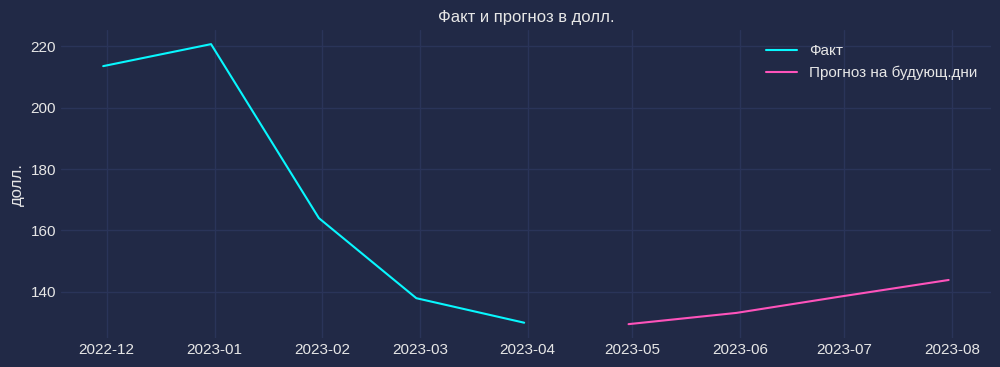

In [172]:
# сравниваю прогноз с фактическими данными
coal_fact = y_m['coal']

coal_pred = y_pred['coal']

print(coal_fact.tail(20))
print('------')
print(coal_pred)

plt.style.use("cyberpunk")
plt.figure(figsize=(12, 4))
plt.plot(coal_fact.tail(5), label='Факт')
plt.plot(coal_pred, label='Прогноз на будующ.дни')
plt.title('Факт и прогноз в долл.')
plt.ylabel('долл.')
plt.legend()
plt.show()

In [173]:
df1_gold = df_gold.drop('gold', axis=1)
df1_gold

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,platinum,silver
Date,,,,,,,,,,
2008-01-02,3.04508,1.68863,NaN,0.11417,NaN,0.53967,0.00356,0.00916,1.80513,0.01770
2008-01-03,3.00402,1.67031,NaN,0.11265,NaN,0.53786,0.00366,0.00886,1.77955,0.01775
2008-01-04,2.90192,1.63553,NaN,0.11214,NaN,0.54078,0.00364,0.00908,1.78322,0.01778
2008-01-07,2.90770,1.64749,NaN,0.10981,NaN,0.54240,0.00364,0.00917,1.77315,0.01766
2008-01-08,2.77962,1.58336,NaN,0.10882,NaN,0.54527,0.00373,0.00907,1.76948,0.01789
...,...,...,...,...,...,...,...,...,...,...
2023-03-09,6.19819,2.14198,1.26059,0.04460,0.06852,0.33811,0.00222,0.00139,0.51758,0.01095
2023-03-10,5.98222,2.07389,1.23080,0.04446,0.07162,0.33526,0.00217,0.00131,0.51541,0.01094
2023-03-13,5.85282,2.01693,1.20286,0.04225,0.07227,0.32667,0.00213,0.00136,0.52440,0.01140


### 8.3 Прогноз VAR по df месячных значений в унциях золота

<a href="#top">К оглавлению</a>

In [174]:
# Специально обрезал данные для обучения
# для обучения 
y_gold = df_gold_month[:'2022-10-31']
y_gold.fillna(0, inplace=True)

# для теста
y_gold_test = df_gold_month['2022-09-01':]

# # Прогноз на период
# fh=[1, 2, 3, 4, 5, 6, 7, 8, 9] 
fh=[1, 2] 

# # обявление способа прогнозирования
forecaster_gold = VAR()

# # подгонка модели
forecaster_gold.fit(y_gold, fh=fh)

# # результат прогноза
y_gold_pred = forecaster_gold.predict()

y_gold_pred

/tmp/ipykernel_175128/4086078915.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_gold.fillna(0, inplace=True)
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,platinum,silver
2022-11-30,6.36573,2.20901,1.28152,0.05602,0.14922,0.40683,0.00202,0.00365,0.49849,0.01150
2022-12-31,6.24469,2.17788,1.20583,0.05556,0.14801,0.40232,0.00195,0.00364,0.50122,0.01134


In [175]:
# вот фактические значения
y_gold_test

,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,platinum,silver
Date,,,,,,,,,,
2022-09-30,6.79098,2.29325,1.32253,0.05380,0.17869,0.40613,0.00207,0.00462,0.52125,0.01120
2022-10-31,6.48516,2.23743,1.36454,0.05620,0.15010,0.41165,0.00209,0.00365,0.55850,0.01162
2022-11-30,6.35778,2.26989,1.37900,0.05286,0.12381,0.38755,0.00213,0.00373,0.58476,0.01219
2022-12-31,6.03246,2.17732,1.35575,0.04526,0.12291,0.36214,0.00212,0.00321,0.57443,0.01300
2023-01-31,5.79579,2.08475,1.33343,0.04413,0.08641,0.35289,0.00217,0.00181,0.55336,0.01249
2023-02-28,6.35950,2.20154,1.30801,0.04507,0.07443,0.36215,0.00221,0.00132,0.51343,0.01181
2023-03-31,6.15773,2.12714,1.25603,0.04428,0.07016,0.34102,0.00218,0.00142,0.51989,0.01127


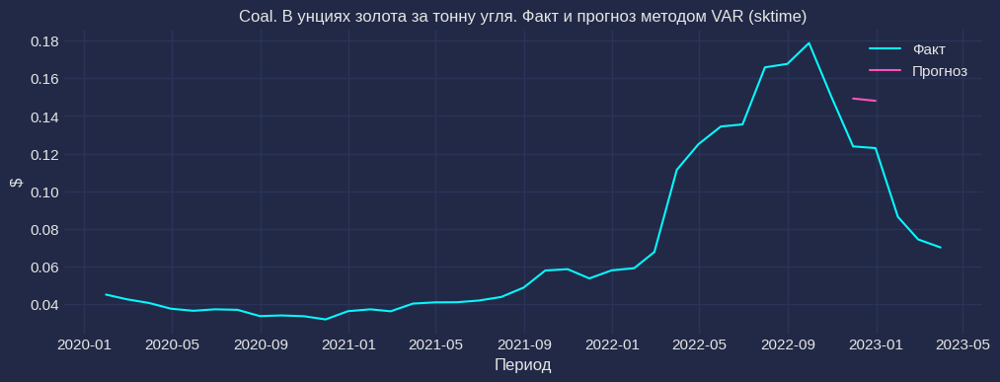

In [177]:
# настройка графиков
plt.style.use("cyberpunk")
# График стоимости угля в унциях золота
plt.figure(figsize=(12, 4))
plt.grid(True)
# plt.plot(y_gold_test['Coal'], label='Факт')
plt.plot(df_gold_month['coal']['2020-01-01':], label='Факт')
plt.plot(y_gold_pred['coal'], label='Прогноз')
plt.title('Coal. В унциях золота за тонну угля. Факт и прогноз методом VAR (sktime)')
plt.ylabel('$')
plt.xlabel('Период')
plt.legend()
plt.show()

### 8.4 Прогноз VAR по всему df в баррелях нефти

<a href="#top">К оглавлению</a>

In [179]:
y_brent.index
y_brent.isna().sum()

NameError: name 'y_brent' is not defined

In [180]:
# Специально обрезал данные для обучения
# для обучения 
# y_brent = df_brent_month[:'2022-10-31']
y_brent = df_brent_month
y_brent.fillna(0, inplace=True)

# для теста
y_brent_test = df_brent_month['2022-09-30':]
y_brent_test.fillna(0, inplace=True)

# # Прогноз на период
# fh=[1, 2, 3, 4, 5, 6, 7, 8, 9]
fh=[1, 2, 3, 4, 5] 

# # обявление способа прогнозирования
forecaster_brent = VAR()

# # подгонка модели
forecaster_brent.fit(y_brent, fh=fh)

# # результат прогноза
y_brent_pred = forecaster_brent.predict()

y_brent_pred

/tmp/ipykernel_175128/3889648587.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_brent_test.fillna(0, inplace=True)
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not ind

,NASDAQ,SP,aluminum,coal,corn,cupper,gaz,gold,platinum,silver
2023-04-30,140.90692,48.52701,27.93278,1.54214,7.49986,0.04847,0.03314,23.39263,13.77867,0.26485
2023-05-31,143.17150,49.14247,27.86292,1.51999,7.34775,0.04815,0.03407,24.14685,13.88955,0.27469
2023-06-30,145.82944,49.83847,27.95812,1.49881,7.24852,0.04811,0.03508,24.87776,14.17420,0.28423
2023-07-31,148.69355,50.56586,28.16980,1.47868,7.18697,0.04826,0.03611,25.55826,14.43834,0.29334
2023-08-31,151.61431,51.28407,28.45102,1.45957,7.15255,0.04855,0.03713,26.16952,14.68701,0.30184


Результат прогноза от 6 ноября 2022:


            NASDAQ	    SP	        aluminum	coal	corn	cupper	gaz	    gold	    platinum	silver
2022-12-31	113.55315	40.82822	24.04991	2.42052	7.32634	0.03702	0.06389	18.55076	10.07181	0.21324
2023-01-31	116.20469	41.94360	24.15183	2.43362	7.43601	0.03747	0.06470	19.87884	10.60298	0.22226
2023-02-28	119.17880	43.05747	24.19178	2.43902	7.52624	0.03800	0.06525	21.15982	11.09962	0.23212
2023-03-31	122.41571	44.15649	24.18418	2.43732	7.60173	0.03860	0.06557	22.38227	11.59121	0.24256
2023-04-30	125.84907	45.22706	24.14131	2.42915	7.66566	0.03926	0.06569	23.53493	12.06660	0.25333

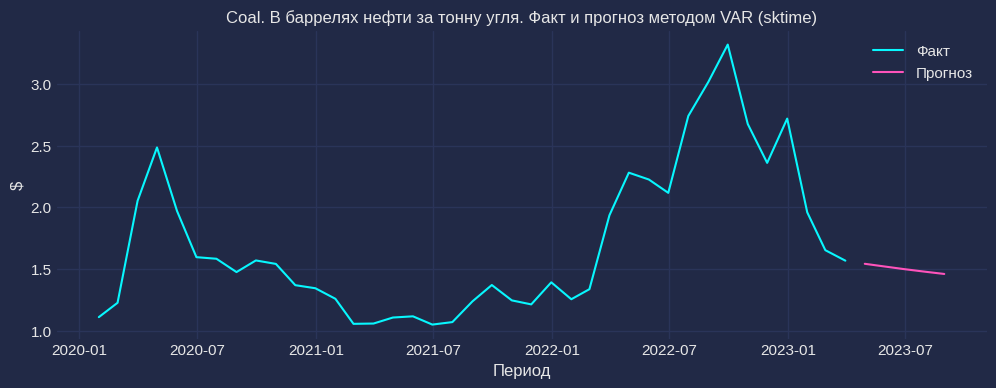

In [181]:
# График стоимости угля в баррелях нефти
# настройка графиков
plt.style.use("cyberpunk")
plt.figure(figsize=(12, 4))
plt.grid(True)

plt.plot(df_brent_month['coal']['2020-01-01':], label='Факт')
plt.plot(y_brent_pred['coal'], label='Прогноз')
plt.title('Coal. В баррелях нефти за тонну угля. Факт и прогноз методом VAR (sktime)')
plt.ylabel('$')
plt.xlabel('Период')
plt.legend()
plt.show()

### MultiplexForecaster

In [182]:
# На основе 

# y_m
# y_m.index

y_d.tail()
# y_d.index

# y_d[:-3]

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-03-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-03-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-03-13,11188.83984,3855.76001,2299.50,80.77,138.14999,624.5,4.0695,2.606,1911.69995,1002.50000,21.793
2023-03-14,11428.15039,3919.29004,2316.75,77.45,135.64999,627.5,4.0105,2.573,1906.19995,994.90002,21.929
2023-03-15,11335.14551,3873.67993,2293.50,74.19,NaN,624.5,3.8910,2.467,1929.40002,968.29999,22.315


In [183]:
# fh=[1, 2, 3]
fh=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 

forecaster = MultiplexForecaster(forecasters=[
    ("ets", AutoETS()),
    ("theta", ThetaForecaster()),
    ("naive", NaiveForecaster()),
    ("arima", ARIMA()),
    ("fbprophet", Prophet())
    ])


cv = ExpandingWindowSplitter(
    start_with_window=True,
    step_length=12)

gscv = ForecastingGridSearchCV(
    cv=cv,
    param_grid={"selected_forecaster":["ets", "theta", "naive", "arima", "fbprophet"]},
    # param_grid={"selected_forecaster":["ets", "theta", "naive", "arima"]},
    # param_grid={"selected_forecaster":["ets", "theta", "arima"]},
    forecaster=forecaster)

In [184]:
gscv.fit(y_d[:-3], fh=fh)


# 57.8s с Prophet
# 8.3s без Prophet

/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:91: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/d

ForecastingGridSearchCV(cv=ExpandingWindowSplitter(step_length=12),
                        forecaster=MultiplexForecaster(forecasters=[('ets',
                                                                     AutoETS()),
                                                                    ('theta',
                                                                     ThetaForecaster()),
                                                                    ('naive',
                                                                     NaiveForecaster()),
                                                                    ('arima',
                                                                     ARIMA()),
                                                                    ('fbprophet',
                                                                     Prophet())]),
                        param_grid={'selected_forecaster': ['ets', 'theta',
                                                            'naive', 'arima',
                                                            'fbprophet']})

In [185]:
y_pred_multi = gscv.predict()

y_pred_multi

/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:148: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:148: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:148: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/sktime/datatypes/_series/_check.py:148: FutureWarning: is_monotonic is deprecated and will be removed in a future version. Use is_monotonic_increasing instead.
  if not index.is_monotonic:
/home/sm360/.local/lib/python3.10/site-packages/skti

Ticker,NASDAQ,SP,aluminum,brent,coal,corn,cupper,gaz,gold,platinum,silver
Date,,,,,,,,,,,
2023-03-13,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04648,2.43,1862.0,960.48820,20.375
2023-03-14,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04680,2.43,1862.0,960.73108,20.375
2023-03-15,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04712,2.43,1862.0,960.96467,20.375
2023-03-16,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04743,2.43,1862.0,961.18931,20.375
2023-03-17,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04773,2.43,1862.0,961.40536,20.375
2023-03-18,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04803,2.43,1862.0,961.61314,20.375
2023-03-19,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04833,2.43,1862.0,961.81297,20.375
2023-03-20,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04863,2.43,1862.0,962.00515,20.375
2023-03-21,11138.88965,3861.59009,2291.75,82.78,133.35001,624.25,4.04892,2.43,1862.0,962.18997,20.375


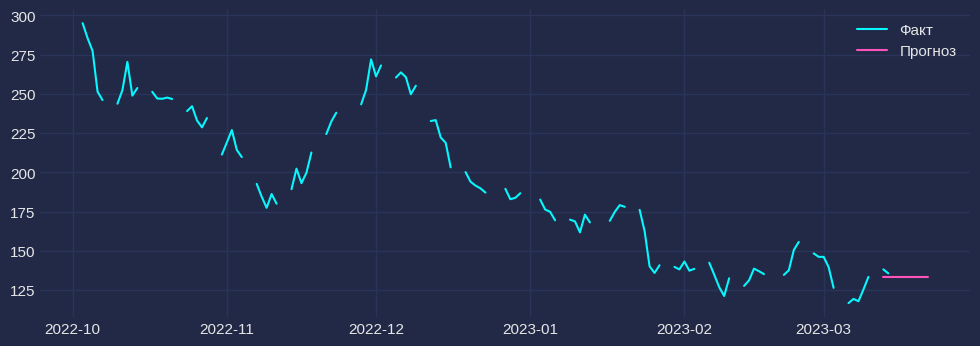

In [186]:
plt.figure(figsize=(12, 4))
plt.plot(y_d['coal']['2022-10-01':], label='Факт')
plt.plot(y_pred_multi['coal'], label='Прогноз')
plt.legend()
plt.show()

#### Finish

<a name="Finish">Окончание</a>

<a href="#top">К оглавлению</a>

Коммерсант2022-10-27 № 200
### Торг уместен, но не очень велик

По мере ослабления глобального
роста мировые цены на сырьевые
товары также продолжат снижаться,
но из-за укрепления доллара США
в местных валютах они по-прежне-
му будут оставаться высокими, что
будет оказывать дополнительное
давление на инфляцию, говорится
в обзоре сырьевых рынков от Все-
мирного банка (ВБ). Так, стоимость
нефти марки Brent с февраля снизи-
лась на 6%, но 60% стран-импорте-
ров нефти и 90% импортеров зерна
столкнулись с ростом цен, выражен-
ных в национальных валютах.
В ВБ ждут, что цены на энерго-
ресурсы после роста в этом году
на 60% снизятся на 11% в 2023-м
и еще на 12% в 2024-м, но и после
этого останутся на 50% выше, чем
в среднем за пять лет. Этот же фак-
тор скажется на увеличении стои-
мости электроэнергии и повыше-
нии транспортных издержек. Цены
на газ в Европе и на уголь, пере-
возимый по морю, уже превыша-
ют средние за пять лет показате-
ли на 420% и 180% — удорожа-
ние природного газа также приве-
дет к увеличению потребления угля.
При этом средняя цена нефти мар-
ки Brent, как ожидается, снизится
со $100 за баррель в 2022 году до
$92 за баррель в 2023-м и $80 за
баррель в 2024-м.

Цены же на неэнергетическое
сырье в третьем квартале этого
года уже снизились на 13% к пре-
дыдущему кварталу, в том числе на
ценные металлы — на 9%, на сель-
хозсырье — на 11% (сейчас они
превышают прошлогодний уро-
вень на 9%). По итогам года ин-
декс стоимости неэнергетическо-
го сырья, как ожидается, вырастет
на 10,5%, в следующем году цены
могут снизиться на 8,1%. Так, сто-
имость металлов после снижения
в этом году на 2% по прогнозу ВБ
упадет на 15% (на это влияет в том
числе спад на рынке недвижимости
в Китае), а затем стабилизирует-
ся. Цены на продовольствие в этом
году вырастут на 13,4% (в том чис-
ле на зерно — на 20,6%), а в сле-
дующем могут снизиться на 5%,
ожидают в банке. Этот прогноз,
однако, подвержен значитель-
ным рискам как в краткосрочной,
так и среднесрочной перспекти-
ве, полагают в ВБ. Более высокие
цены на энергоресурсы, к приме-
ру, могут поддержать повышение
цен и на другое сырье, в частно-
сти, на удобрения: их стоимость за
год увеличится на 66,1%, в следу-
ющем году ожидается ее снижение
на 12,4%. Также прогноз предус-
матривает возвращение на рынок
большего объема поставок продо-
вольствия с Украины.
Татьяна Едовина